# Simulation | [0,-27] Free-Free

In [1]:
import joblib
import timeit

def savedata( name, obj ):
    tic=timeit.default_timer()
    with open( name,'wb' ) as Gv:
        joblib.dump( obj, Gv)
    toc=timeit.default_timer()
    print(toc - tic)
    
def loaddata( name ):
    tic=timeit.default_timer()
    with open( name,'rb' ) as Gv:
        mydata = joblib.load( Gv)
    toc=timeit.default_timer()
    print(toc - tic)
    return mydata

def load_Gfree_fitmap():
    Gfree_FoV2_fitmap = loaddata('Gfree_FoV2_fitmap.db')
    Gfree_FoV4_fitmap = loaddata('Gfree_FoV4_fitmap.db')
    return Gfree_FoV4_fitmap, Gfree_FoV2_fitmap
    
def load_Gsync_fitmap():
    Gsync_FoV2_fitmap = loaddata('Gsync_FoV2_fitmap.db')
    Gsync_FoV4_fitmap = loaddata('Gsync_FoV4_fitmap.db')
    return Gsync_FoV4_fitmap, Gsync_FoV2_fitmap

def load_Gfree_simmap():
    Fov4patch_map = loaddata('Gfree_FoV4_simmap.db')
    Fov4patch_gss = loaddata('Gfree_FoV4_simgss.db')
    Fov2patch_map = loaddata('Gfree_FoV2_simmap.db')
    Fov2patch_gss = loaddata('Gfree_FoV2_simgss.db')
    return Fov4patch_map, Fov4patch_gss, Fov2patch_map, Fov2patch_gss

def load_Gsync_simmap():
    Fov4patch_map = loaddata('Gsync_FoV4_simmap.db')
    Fov4patch_gss = loaddata('Gsync_FoV4_simgss.db')
    Fov2patch_map = loaddata('Gsync_FoV2_simmap.db')
    Fov2patch_gss = loaddata('Gsync_FoV2_simgss.db')
    return Fov4patch_map, Fov4patch_gss, Fov2patch_map, Fov2patch_gss

In [2]:
import pickle
from MCMC import MCMC
%matplotlib inline
from GalacticDev import GalacticDev

In [3]:
from GalacticCore import *
from astropy.io import fits

### Load maps

In [4]:
SF4_map, SF4_gss, SF2_map, SF2_gss = load_Gfree_simmap()

0.34072782658040524
0.5032840445637703
0.08451498299837112
0.08565277233719826


In [5]:
SF4_fitmap, SF2_fitmap = load_Gfree_fitmap()

0.016778718680143356
0.10718442313373089


#### Set-up gss-map

In [6]:
fov2grf = {}
fov2grf['fit'] = whiten(SF2_fitmap['gss'])
fov2grf['sim'] = whiten(SF2_gss)

In [7]:
fov4grf = {}
fov4grf['fit'] = whiten(SF4_fitmap['gss'])
fov4grf['sim'] = whiten(SF4_gss)

### FoV2x2

In [8]:
Sfov2 = GalacticDev( comp='Gfree', nside=32768, use_G02=True, extra_large_mode=True, grfmap=fov2grf, grfpatch=True, fov = ( 2, 2 ), sim_pixel = 2, default=True )

2022-08-13 13:22:32,422 : createlog : INFO : Log Header >> Action Time : Fuction or method: level : Message
2022-08-13 13:22:32,423 : createlog : INFO : Log standard output streaming is False
2022-08-13 13:22:32,423 : createlog : INFO : GSim_Gfree_Default_True_08_13_2022_132232.log log file is created
2022-08-13 13:22:32,424 : createlog : INFO : Log is created by cxshan
2022-08-13 13:22:32,424 : createlog : INFO : Log level is debug
2022-08-13 13:22:32,425 : __init__ : INFO :  ⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇ 
2022-08-13 13:22:32,426 : __init__ : INFO :  Galactic Gfree simulation is initializing! 
2022-08-13 13:22:32,426 : __init__ : WARNING :  sigma_tem default unit is [arcmin]! 
2022-08-13 13:22:32,427 : _set_comp : INFO : compID is galactic/freefree, name is Galactic free-free
2022-08-13 13:22:32,427 : _set_default_io : INFO : Default IO is set. Output dir is /home/cxshan/data/fg21sim+/GalacticSimData/, clobber is True.
2022-08-13 13:22:32,428 : _set_default_params : INFO :  Default settings ar

 Please update the healpix maps when you need to. 


In [9]:
Sfov2.set_gamma(-2.42645582)

2022-08-13 13:22:32,772 : set_gamma : INFO :  gamma is set as -2.42645582 


In [10]:
Sfov2.set_alpha(0.007854707431278349)
Sfov2.set_beta(0.5260103708880837)

2022-08-13 13:22:32,798 : set_alpha : INFO :  alpha is set as 0.007854707431278349 
2022-08-13 13:22:32,799 : set_beta : INFO :  beta is set as 0.5260103708880837 


#### Set up frequency simulation

In [11]:
Sfov2._set_up_freq()

2022-08-13 13:22:32,818 : gen_simmap : INFO : Using mask filled map to generate simulation image.
2022-08-13 13:22:57,918 : gen_simmap : INFO :  Finish generating the original image for simulation, using 25.099065164104104 s.
2022-08-13 13:22:57,919 : gen_simmap : INFO : Input patch flag detected. Using user input GRF patch for simulation.
2022-08-13 13:22:58,067 : _set_physical_params : INFO :  Physical params are set. 


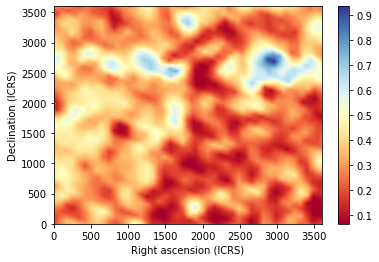

In [12]:
Sfov2.viewslice(Sfov2.patch_map)

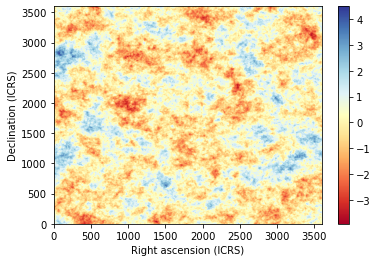

In [13]:
Sfov2.viewslice(Sfov2.patch_gss)

In [14]:
smoothed_input_map = Sfov2.smooth_sky(0.4, Sfov2.skypatch)

2022-08-13 13:23:00,840 : smooth_sky : INFO : Smoothing the <Ut.sky.SkyPatch object at 0x7ffb7bfb2850> with a Gaussian filter ...
2022-08-13 13:23:09,407 : smooth_sky : INFO : Smoothed sky patch using Gaussian filter of sigma = 72.00 [pixel]


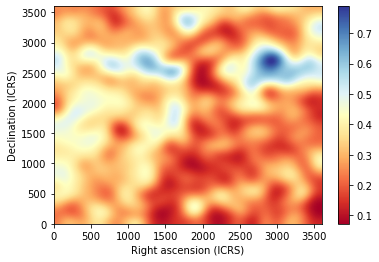

In [15]:
Sfov2.viewslice(smoothed_input_map)

In [16]:
Sfov2.skypatch.data = smoothed_input_map

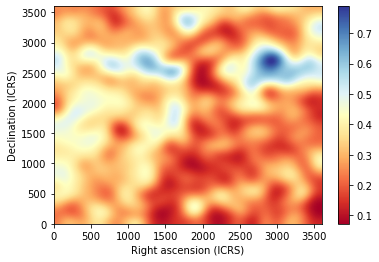

In [17]:
Sfov2.viewslice(Sfov2.skypatch.data)

In [18]:
Sfov2.filename_pattern = '{prefix}_fov2_0-27_{frequency:06.2f}.fits'

In [19]:
Sfov2.filename_pattern

'{prefix}_fov2_0-27_{frequency:06.2f}.fits'

### Simulate one freq

In [20]:
F158 = Sfov2.simulate_frequency(158,skytype='patch')

2022-08-13 13:23:12,174 : simulate_frequency : INFO : Simulating Galactic free-free map at 158.00 [MHz] ...
2022-08-13 13:23:12,299 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:23:13,499 : simulate_frequency : INFO : Done simulate map at 158.00 [MHz].


In [21]:
F158.data[0:100,0:100].shape

(100, 100)

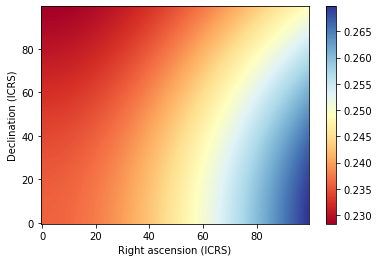

In [22]:
Sfov2.viewslice(smoothed_input_map[0:100,0:100])

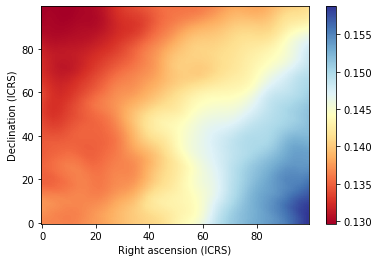

In [23]:
Sfov2.viewslice(F158.data[0:100,0:100])

### Simulate full freq bands

In [24]:
def do_simulation( freqlist, T, outdir ):
    T.output_dir = outdir
    for i in freqlist:
        sky = T.simulate(i, skytype='patch', smooth=False)
        print(sky)
        hdu = fits.open(sky[0])
        T.viewslice(hdu[0].data)

In [25]:
fov2_outhig = '/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196'
fov2_outmid = '/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162'
fov2_outlow = '/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128'

##### Low band

2022-08-13 13:23:14,033 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:23:14,034 : simulate_frequency : INFO : Simulating Galactic free-free map at 120.00 [MHz] ...
2022-08-13 13:23:14,158 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:23:15,357 : simulate_frequency : INFO : Done simulate map at 120.00 [MHz].
2022-08-13 13:23:15,590 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov2_0-27_120.00.fits']


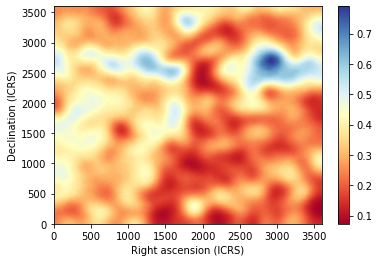

2022-08-13 13:23:16,936 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:23:16,937 : simulate_frequency : INFO : Simulating Galactic free-free map at 120.16 [MHz] ...
2022-08-13 13:23:17,060 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:23:18,258 : simulate_frequency : INFO : Done simulate map at 120.16 [MHz].
2022-08-13 13:23:18,340 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov2_0-27_120.16.fits']


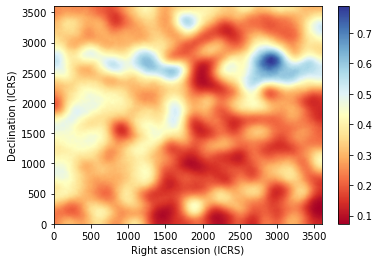

2022-08-13 13:23:19,578 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:23:19,579 : simulate_frequency : INFO : Simulating Galactic free-free map at 120.32 [MHz] ...
2022-08-13 13:23:19,702 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:23:20,901 : simulate_frequency : INFO : Done simulate map at 120.32 [MHz].
2022-08-13 13:23:20,985 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov2_0-27_120.32.fits']


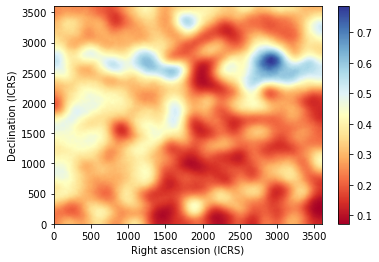

2022-08-13 13:23:22,221 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:23:22,222 : simulate_frequency : INFO : Simulating Galactic free-free map at 120.48 [MHz] ...
2022-08-13 13:23:22,345 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:23:23,544 : simulate_frequency : INFO : Done simulate map at 120.48 [MHz].
2022-08-13 13:23:23,626 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov2_0-27_120.48.fits']


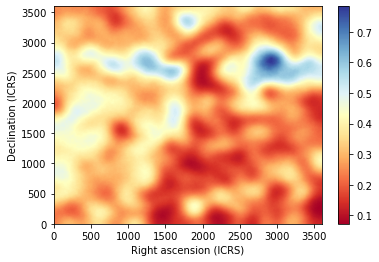

2022-08-13 13:23:24,864 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:23:24,865 : simulate_frequency : INFO : Simulating Galactic free-free map at 120.64 [MHz] ...
2022-08-13 13:23:24,988 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:23:26,186 : simulate_frequency : INFO : Done simulate map at 120.64 [MHz].
2022-08-13 13:23:26,269 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov2_0-27_120.64.fits']


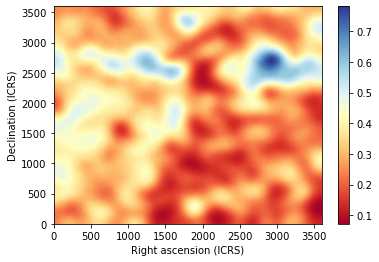

2022-08-13 13:23:27,507 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:23:27,508 : simulate_frequency : INFO : Simulating Galactic free-free map at 120.80 [MHz] ...
2022-08-13 13:23:27,631 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:23:28,830 : simulate_frequency : INFO : Done simulate map at 120.80 [MHz].
2022-08-13 13:23:28,912 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov2_0-27_120.80.fits']


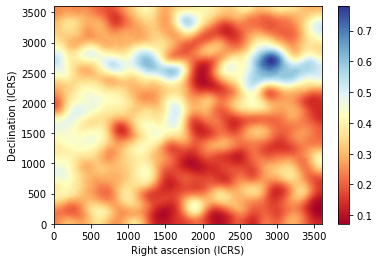

2022-08-13 13:23:30,149 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:23:30,150 : simulate_frequency : INFO : Simulating Galactic free-free map at 120.96 [MHz] ...
2022-08-13 13:23:30,273 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:23:31,472 : simulate_frequency : INFO : Done simulate map at 120.96 [MHz].
2022-08-13 13:23:31,553 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov2_0-27_120.96.fits']


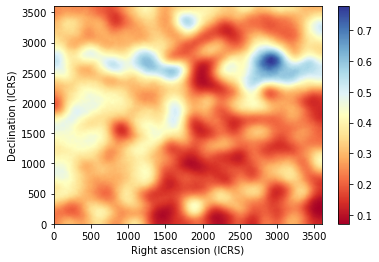

2022-08-13 13:23:32,793 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:23:32,794 : simulate_frequency : INFO : Simulating Galactic free-free map at 121.12 [MHz] ...
2022-08-13 13:23:32,918 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:23:34,116 : simulate_frequency : INFO : Done simulate map at 121.12 [MHz].
2022-08-13 13:23:34,236 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov2_0-27_121.12.fits']


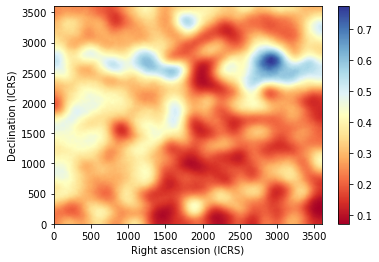

2022-08-13 13:23:35,474 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:23:35,475 : simulate_frequency : INFO : Simulating Galactic free-free map at 121.28 [MHz] ...
2022-08-13 13:23:35,598 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:23:36,796 : simulate_frequency : INFO : Done simulate map at 121.28 [MHz].
2022-08-13 13:23:36,878 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov2_0-27_121.28.fits']


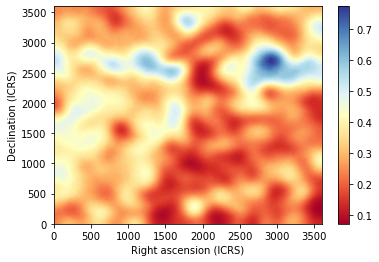

2022-08-13 13:23:38,116 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:23:38,117 : simulate_frequency : INFO : Simulating Galactic free-free map at 121.44 [MHz] ...
2022-08-13 13:23:38,240 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:23:39,439 : simulate_frequency : INFO : Done simulate map at 121.44 [MHz].
2022-08-13 13:23:39,521 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov2_0-27_121.44.fits']


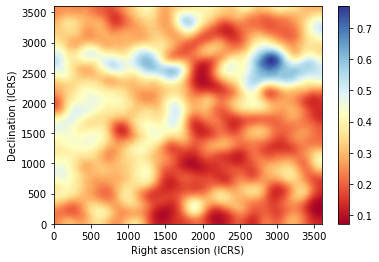

2022-08-13 13:23:40,761 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:23:40,762 : simulate_frequency : INFO : Simulating Galactic free-free map at 121.60 [MHz] ...
2022-08-13 13:23:40,885 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:23:42,086 : simulate_frequency : INFO : Done simulate map at 121.60 [MHz].
2022-08-13 13:23:42,167 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov2_0-27_121.60.fits']


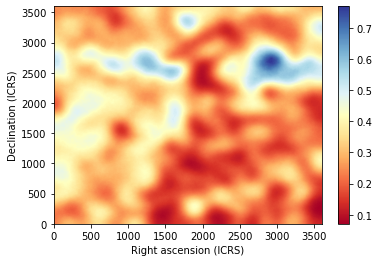

2022-08-13 13:23:43,407 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:23:43,408 : simulate_frequency : INFO : Simulating Galactic free-free map at 121.76 [MHz] ...
2022-08-13 13:23:43,532 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:23:44,732 : simulate_frequency : INFO : Done simulate map at 121.76 [MHz].
2022-08-13 13:23:44,812 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov2_0-27_121.76.fits']


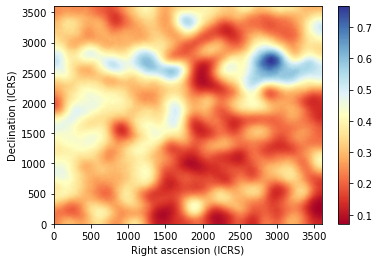

2022-08-13 13:23:46,174 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:23:46,175 : simulate_frequency : INFO : Simulating Galactic free-free map at 121.92 [MHz] ...
2022-08-13 13:23:46,298 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:23:47,498 : simulate_frequency : INFO : Done simulate map at 121.92 [MHz].
2022-08-13 13:23:47,580 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov2_0-27_121.92.fits']


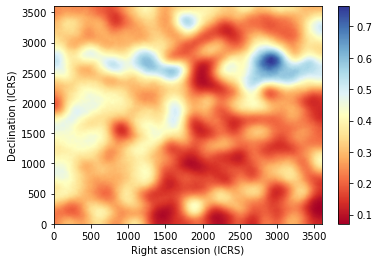

2022-08-13 13:23:48,819 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:23:48,820 : simulate_frequency : INFO : Simulating Galactic free-free map at 122.08 [MHz] ...
2022-08-13 13:23:48,943 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:23:50,142 : simulate_frequency : INFO : Done simulate map at 122.08 [MHz].
2022-08-13 13:23:50,223 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov2_0-27_122.08.fits']


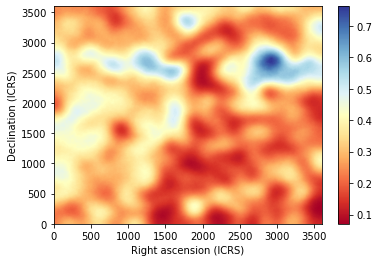

2022-08-13 13:23:51,461 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:23:51,462 : simulate_frequency : INFO : Simulating Galactic free-free map at 122.24 [MHz] ...
2022-08-13 13:23:51,585 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:23:52,786 : simulate_frequency : INFO : Done simulate map at 122.24 [MHz].
2022-08-13 13:23:52,867 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov2_0-27_122.24.fits']


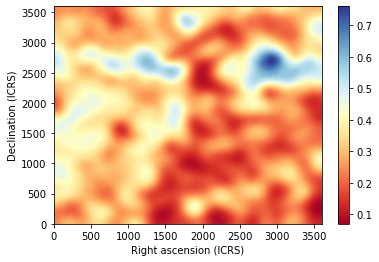

2022-08-13 13:23:54,176 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:23:54,178 : simulate_frequency : INFO : Simulating Galactic free-free map at 122.40 [MHz] ...
2022-08-13 13:23:54,347 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:23:55,646 : simulate_frequency : INFO : Done simulate map at 122.40 [MHz].
2022-08-13 13:23:55,732 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov2_0-27_122.40.fits']


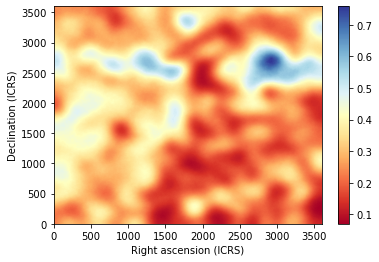

2022-08-13 13:23:56,994 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:23:56,996 : simulate_frequency : INFO : Simulating Galactic free-free map at 122.56 [MHz] ...
2022-08-13 13:23:57,163 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:23:58,462 : simulate_frequency : INFO : Done simulate map at 122.56 [MHz].
2022-08-13 13:23:58,548 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov2_0-27_122.56.fits']


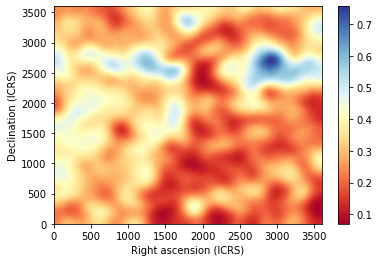

2022-08-13 13:23:59,809 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:23:59,811 : simulate_frequency : INFO : Simulating Galactic free-free map at 122.72 [MHz] ...
2022-08-13 13:23:59,979 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:24:01,279 : simulate_frequency : INFO : Done simulate map at 122.72 [MHz].
2022-08-13 13:24:01,364 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov2_0-27_122.72.fits']


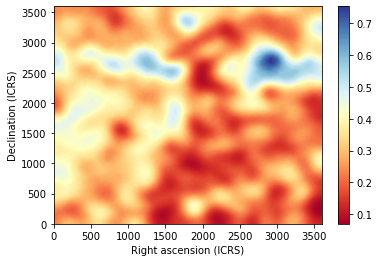

2022-08-13 13:24:02,629 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:24:02,630 : simulate_frequency : INFO : Simulating Galactic free-free map at 122.88 [MHz] ...
2022-08-13 13:24:02,799 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:24:04,098 : simulate_frequency : INFO : Done simulate map at 122.88 [MHz].
2022-08-13 13:24:04,184 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov2_0-27_122.88.fits']


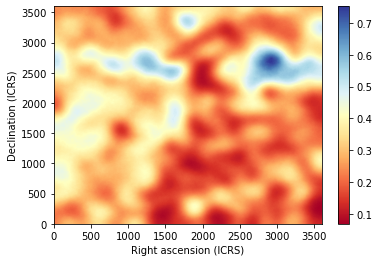

2022-08-13 13:24:05,448 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:24:05,449 : simulate_frequency : INFO : Simulating Galactic free-free map at 123.04 [MHz] ...
2022-08-13 13:24:05,617 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:24:06,917 : simulate_frequency : INFO : Done simulate map at 123.04 [MHz].
2022-08-13 13:24:07,002 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov2_0-27_123.04.fits']


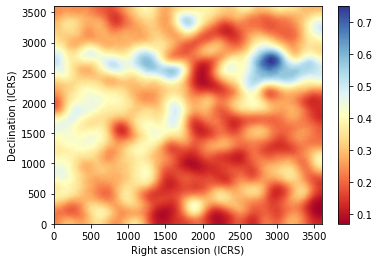

2022-08-13 13:24:08,264 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:24:08,265 : simulate_frequency : INFO : Simulating Galactic free-free map at 123.20 [MHz] ...
2022-08-13 13:24:08,434 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:24:09,733 : simulate_frequency : INFO : Done simulate map at 123.20 [MHz].
2022-08-13 13:24:09,819 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov2_0-27_123.20.fits']


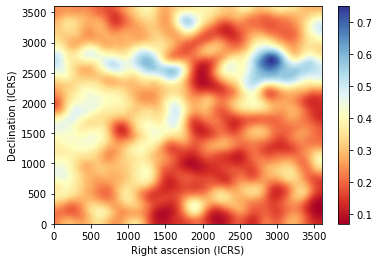

2022-08-13 13:24:11,083 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:24:11,084 : simulate_frequency : INFO : Simulating Galactic free-free map at 123.36 [MHz] ...
2022-08-13 13:24:11,253 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:24:12,552 : simulate_frequency : INFO : Done simulate map at 123.36 [MHz].
2022-08-13 13:24:12,638 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov2_0-27_123.36.fits']


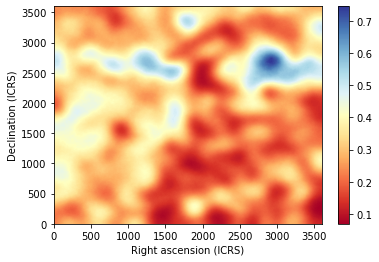

2022-08-13 13:24:13,902 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:24:13,903 : simulate_frequency : INFO : Simulating Galactic free-free map at 123.52 [MHz] ...
2022-08-13 13:24:14,073 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:24:15,373 : simulate_frequency : INFO : Done simulate map at 123.52 [MHz].
2022-08-13 13:24:15,458 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov2_0-27_123.52.fits']


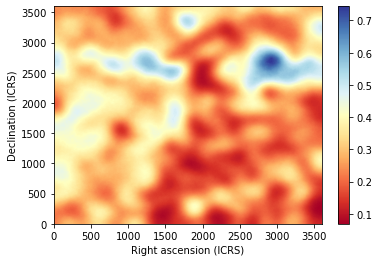

2022-08-13 13:24:17,114 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:24:17,116 : simulate_frequency : INFO : Simulating Galactic free-free map at 123.68 [MHz] ...
2022-08-13 13:24:17,284 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:24:18,583 : simulate_frequency : INFO : Done simulate map at 123.68 [MHz].
2022-08-13 13:24:18,669 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov2_0-27_123.68.fits']


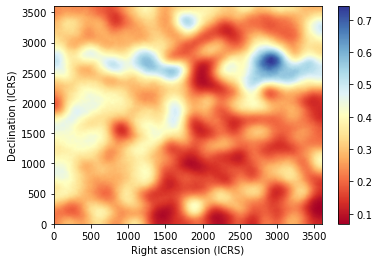

2022-08-13 13:24:19,932 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:24:19,933 : simulate_frequency : INFO : Simulating Galactic free-free map at 123.84 [MHz] ...
2022-08-13 13:24:20,102 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:24:21,401 : simulate_frequency : INFO : Done simulate map at 123.84 [MHz].
2022-08-13 13:24:21,487 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov2_0-27_123.84.fits']


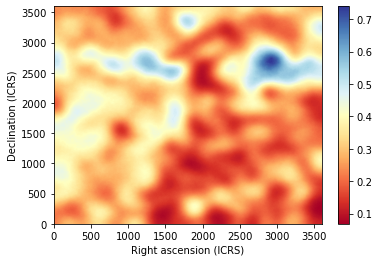

2022-08-13 13:24:22,750 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:24:22,752 : simulate_frequency : INFO : Simulating Galactic free-free map at 124.00 [MHz] ...
2022-08-13 13:24:22,920 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:24:24,219 : simulate_frequency : INFO : Done simulate map at 124.00 [MHz].
2022-08-13 13:24:24,305 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov2_0-27_124.00.fits']


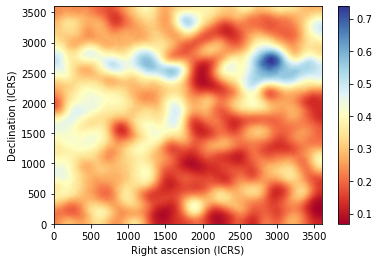

2022-08-13 13:24:25,571 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:24:25,572 : simulate_frequency : INFO : Simulating Galactic free-free map at 124.16 [MHz] ...
2022-08-13 13:24:25,741 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:24:27,040 : simulate_frequency : INFO : Done simulate map at 124.16 [MHz].
2022-08-13 13:24:27,125 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov2_0-27_124.16.fits']


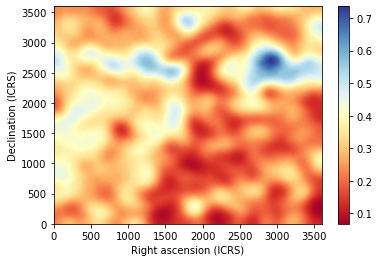

2022-08-13 13:24:28,389 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:24:28,390 : simulate_frequency : INFO : Simulating Galactic free-free map at 124.32 [MHz] ...
2022-08-13 13:24:28,559 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:24:29,857 : simulate_frequency : INFO : Done simulate map at 124.32 [MHz].
2022-08-13 13:24:30,061 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov2_0-27_124.32.fits']


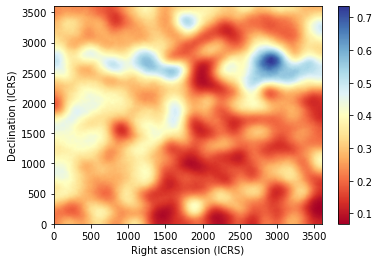

2022-08-13 13:24:31,323 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:24:31,324 : simulate_frequency : INFO : Simulating Galactic free-free map at 124.48 [MHz] ...
2022-08-13 13:24:31,493 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:24:32,793 : simulate_frequency : INFO : Done simulate map at 124.48 [MHz].
2022-08-13 13:24:32,879 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov2_0-27_124.48.fits']


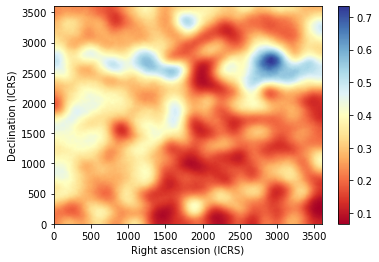

2022-08-13 13:24:34,143 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:24:34,145 : simulate_frequency : INFO : Simulating Galactic free-free map at 124.64 [MHz] ...
2022-08-13 13:24:34,314 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:24:35,613 : simulate_frequency : INFO : Done simulate map at 124.64 [MHz].
2022-08-13 13:24:35,753 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov2_0-27_124.64.fits']


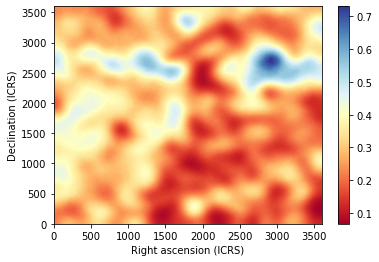

2022-08-13 13:24:37,015 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:24:37,016 : simulate_frequency : INFO : Simulating Galactic free-free map at 124.80 [MHz] ...
2022-08-13 13:24:37,184 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:24:38,483 : simulate_frequency : INFO : Done simulate map at 124.80 [MHz].
2022-08-13 13:24:38,568 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov2_0-27_124.80.fits']


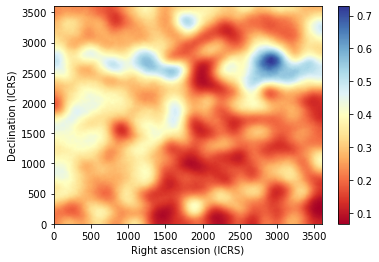

2022-08-13 13:24:39,831 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:24:39,832 : simulate_frequency : INFO : Simulating Galactic free-free map at 124.96 [MHz] ...
2022-08-13 13:24:40,004 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:24:41,305 : simulate_frequency : INFO : Done simulate map at 124.96 [MHz].
2022-08-13 13:24:41,411 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov2_0-27_124.96.fits']


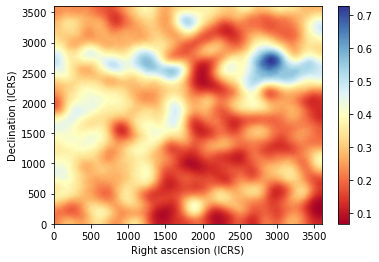

2022-08-13 13:24:42,674 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:24:42,676 : simulate_frequency : INFO : Simulating Galactic free-free map at 125.12 [MHz] ...
2022-08-13 13:24:42,845 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:24:44,145 : simulate_frequency : INFO : Done simulate map at 125.12 [MHz].
2022-08-13 13:24:44,230 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov2_0-27_125.12.fits']


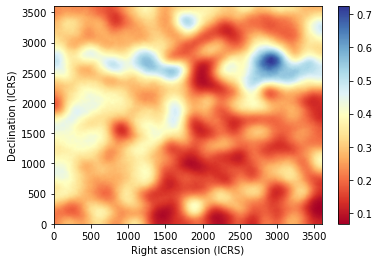

2022-08-13 13:24:45,492 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:24:45,494 : simulate_frequency : INFO : Simulating Galactic free-free map at 125.28 [MHz] ...
2022-08-13 13:24:45,662 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:24:46,960 : simulate_frequency : INFO : Done simulate map at 125.28 [MHz].
2022-08-13 13:24:47,045 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov2_0-27_125.28.fits']


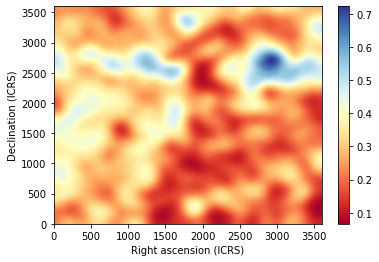

2022-08-13 13:24:48,697 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:24:48,698 : simulate_frequency : INFO : Simulating Galactic free-free map at 125.44 [MHz] ...
2022-08-13 13:24:48,866 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:24:50,166 : simulate_frequency : INFO : Done simulate map at 125.44 [MHz].
2022-08-13 13:24:50,252 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov2_0-27_125.44.fits']


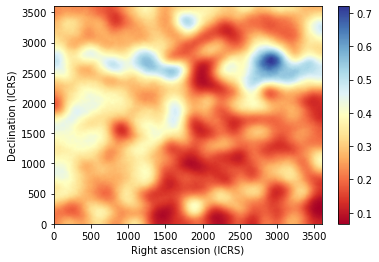

2022-08-13 13:24:51,517 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:24:51,519 : simulate_frequency : INFO : Simulating Galactic free-free map at 125.60 [MHz] ...
2022-08-13 13:24:51,688 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:24:52,986 : simulate_frequency : INFO : Done simulate map at 125.60 [MHz].
2022-08-13 13:24:53,130 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov2_0-27_125.60.fits']


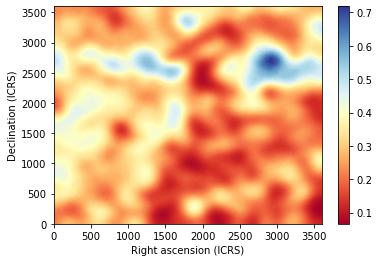

2022-08-13 13:24:54,392 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:24:54,394 : simulate_frequency : INFO : Simulating Galactic free-free map at 125.76 [MHz] ...
2022-08-13 13:24:54,562 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:24:55,860 : simulate_frequency : INFO : Done simulate map at 125.76 [MHz].
2022-08-13 13:24:55,945 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov2_0-27_125.76.fits']


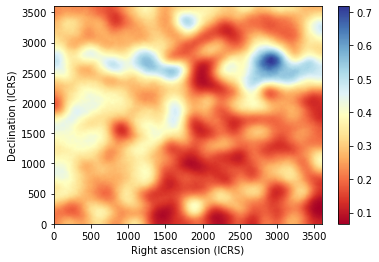

2022-08-13 13:24:57,210 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:24:57,211 : simulate_frequency : INFO : Simulating Galactic free-free map at 125.92 [MHz] ...
2022-08-13 13:24:57,380 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:24:58,677 : simulate_frequency : INFO : Done simulate map at 125.92 [MHz].
2022-08-13 13:24:58,762 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov2_0-27_125.92.fits']


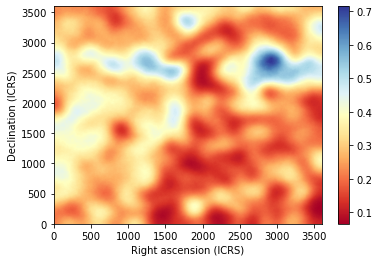

2022-08-13 13:25:00,027 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:25:00,029 : simulate_frequency : INFO : Simulating Galactic free-free map at 126.08 [MHz] ...
2022-08-13 13:25:00,197 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:25:01,495 : simulate_frequency : INFO : Done simulate map at 126.08 [MHz].
2022-08-13 13:25:01,580 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov2_0-27_126.08.fits']


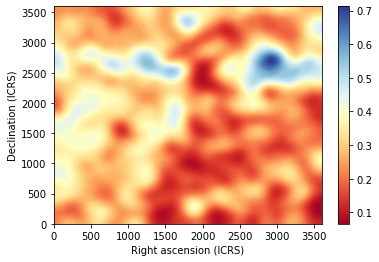

2022-08-13 13:25:02,841 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:25:02,842 : simulate_frequency : INFO : Simulating Galactic free-free map at 126.24 [MHz] ...
2022-08-13 13:25:03,010 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:25:04,308 : simulate_frequency : INFO : Done simulate map at 126.24 [MHz].
2022-08-13 13:25:04,393 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov2_0-27_126.24.fits']


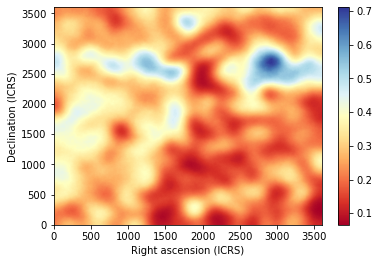

2022-08-13 13:25:05,656 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:25:05,657 : simulate_frequency : INFO : Simulating Galactic free-free map at 126.40 [MHz] ...
2022-08-13 13:25:05,826 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:25:07,124 : simulate_frequency : INFO : Done simulate map at 126.40 [MHz].
2022-08-13 13:25:07,210 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov2_0-27_126.40.fits']


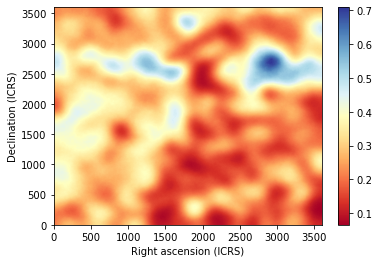

2022-08-13 13:25:08,491 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:25:08,493 : simulate_frequency : INFO : Simulating Galactic free-free map at 126.56 [MHz] ...
2022-08-13 13:25:08,666 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:25:09,982 : simulate_frequency : INFO : Done simulate map at 126.56 [MHz].
2022-08-13 13:25:10,086 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov2_0-27_126.56.fits']


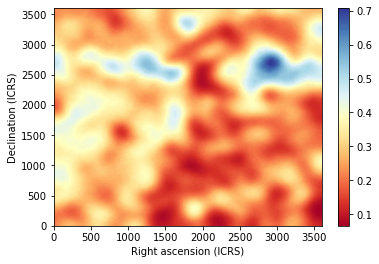

2022-08-13 13:25:11,381 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:25:11,382 : simulate_frequency : INFO : Simulating Galactic free-free map at 126.72 [MHz] ...
2022-08-13 13:25:11,537 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:25:12,761 : simulate_frequency : INFO : Done simulate map at 126.72 [MHz].
2022-08-13 13:25:12,845 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov2_0-27_126.72.fits']


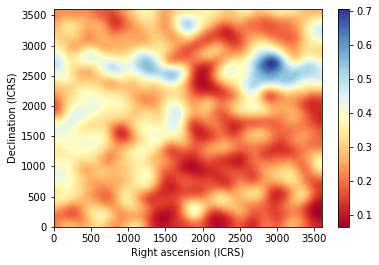

2022-08-13 13:25:14,086 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:25:14,087 : simulate_frequency : INFO : Simulating Galactic free-free map at 126.88 [MHz] ...
2022-08-13 13:25:14,211 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:25:15,410 : simulate_frequency : INFO : Done simulate map at 126.88 [MHz].
2022-08-13 13:25:15,492 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov2_0-27_126.88.fits']


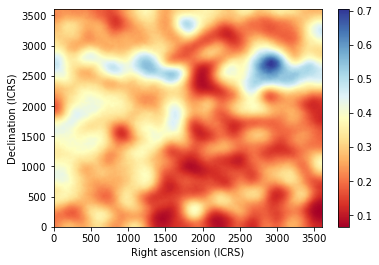

2022-08-13 13:25:16,732 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:25:16,733 : simulate_frequency : INFO : Simulating Galactic free-free map at 127.04 [MHz] ...
2022-08-13 13:25:16,857 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:25:18,056 : simulate_frequency : INFO : Done simulate map at 127.04 [MHz].
2022-08-13 13:25:18,138 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov2_0-27_127.04.fits']


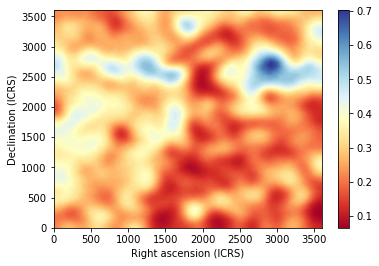

2022-08-13 13:25:19,575 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:25:19,577 : simulate_frequency : INFO : Simulating Galactic free-free map at 127.20 [MHz] ...
2022-08-13 13:25:19,700 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:25:20,899 : simulate_frequency : INFO : Done simulate map at 127.20 [MHz].
2022-08-13 13:25:20,982 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov2_0-27_127.20.fits']


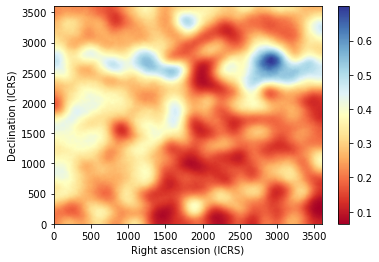

2022-08-13 13:25:22,215 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:25:22,216 : simulate_frequency : INFO : Simulating Galactic free-free map at 127.36 [MHz] ...
2022-08-13 13:25:22,338 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:25:23,537 : simulate_frequency : INFO : Done simulate map at 127.36 [MHz].
2022-08-13 13:25:23,617 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov2_0-27_127.36.fits']


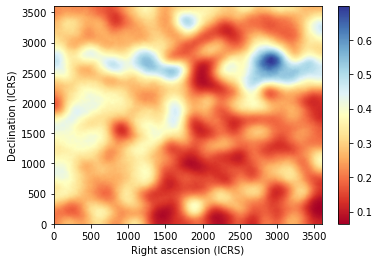

2022-08-13 13:25:24,856 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:25:24,857 : simulate_frequency : INFO : Simulating Galactic free-free map at 127.52 [MHz] ...
2022-08-13 13:25:24,983 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:25:26,187 : simulate_frequency : INFO : Done simulate map at 127.52 [MHz].
2022-08-13 13:25:26,270 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov2_0-27_127.52.fits']


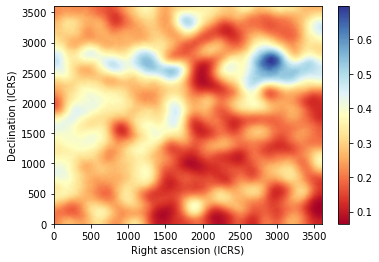

2022-08-13 13:25:27,508 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:25:27,509 : simulate_frequency : INFO : Simulating Galactic free-free map at 127.68 [MHz] ...
2022-08-13 13:25:27,631 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:25:28,831 : simulate_frequency : INFO : Done simulate map at 127.68 [MHz].
2022-08-13 13:25:28,929 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov2_0-27_127.68.fits']


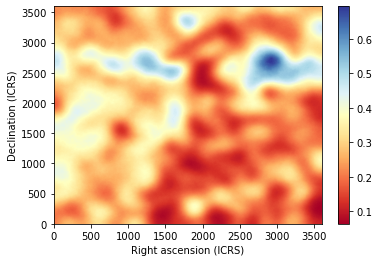

2022-08-13 13:25:30,168 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:25:30,169 : simulate_frequency : INFO : Simulating Galactic free-free map at 127.84 [MHz] ...
2022-08-13 13:25:30,293 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:25:31,494 : simulate_frequency : INFO : Done simulate map at 127.84 [MHz].
2022-08-13 13:25:31,576 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov2_0-27_127.84.fits']


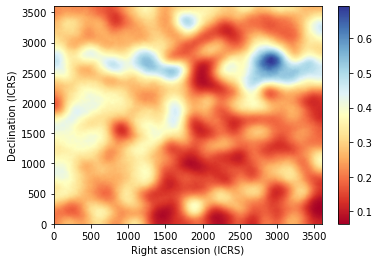

2022-08-13 13:25:32,814 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:25:32,815 : simulate_frequency : INFO : Simulating Galactic free-free map at 128.00 [MHz] ...
2022-08-13 13:25:32,938 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:25:34,138 : simulate_frequency : INFO : Done simulate map at 128.00 [MHz].
2022-08-13 13:25:34,220 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128/gfree_fov2_0-27_128.00.fits']


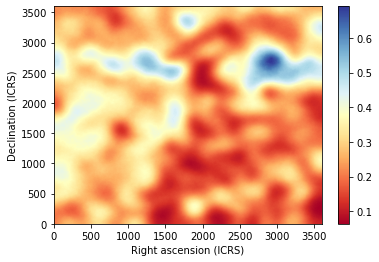

In [26]:
do_simulation(Sfov2.freqs['low']['f'], Sfov2, fov2_outlow)

##### Mid band

2022-08-13 13:25:35,465 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:25:35,467 : simulate_frequency : INFO : Simulating Galactic free-free map at 154.00 [MHz] ...
2022-08-13 13:25:35,592 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:25:36,792 : simulate_frequency : INFO : Done simulate map at 154.00 [MHz].
2022-08-13 13:25:36,922 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov2_0-27_154.00.fits']


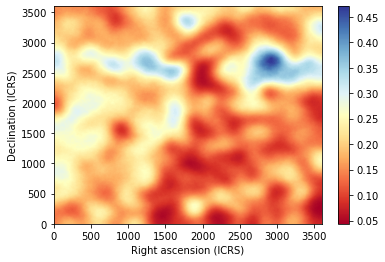

2022-08-13 13:25:38,169 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:25:38,170 : simulate_frequency : INFO : Simulating Galactic free-free map at 154.16 [MHz] ...
2022-08-13 13:25:38,293 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:25:39,494 : simulate_frequency : INFO : Done simulate map at 154.16 [MHz].
2022-08-13 13:25:39,631 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov2_0-27_154.16.fits']


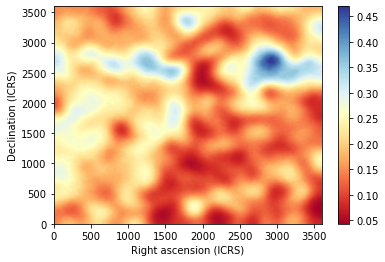

2022-08-13 13:25:40,880 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:25:40,881 : simulate_frequency : INFO : Simulating Galactic free-free map at 154.32 [MHz] ...
2022-08-13 13:25:41,004 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:25:42,204 : simulate_frequency : INFO : Done simulate map at 154.32 [MHz].
2022-08-13 13:25:42,299 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov2_0-27_154.32.fits']


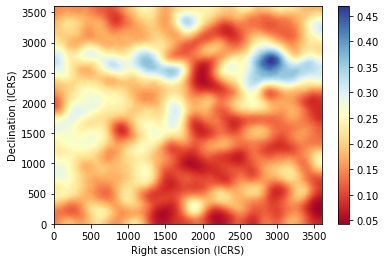

2022-08-13 13:25:43,551 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:25:43,551 : simulate_frequency : INFO : Simulating Galactic free-free map at 154.48 [MHz] ...
2022-08-13 13:25:43,674 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:25:44,873 : simulate_frequency : INFO : Done simulate map at 154.48 [MHz].
2022-08-13 13:25:45,030 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov2_0-27_154.48.fits']


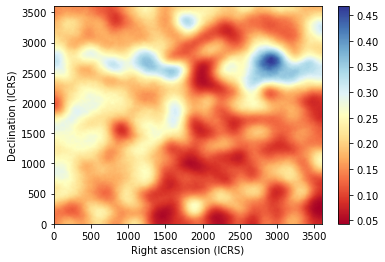

2022-08-13 13:25:46,280 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:25:46,281 : simulate_frequency : INFO : Simulating Galactic free-free map at 154.64 [MHz] ...
2022-08-13 13:25:46,404 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:25:47,603 : simulate_frequency : INFO : Done simulate map at 154.64 [MHz].
2022-08-13 13:25:47,814 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov2_0-27_154.64.fits']


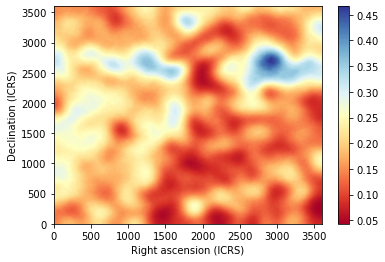

2022-08-13 13:25:49,192 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:25:49,193 : simulate_frequency : INFO : Simulating Galactic free-free map at 154.80 [MHz] ...
2022-08-13 13:25:49,316 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:25:50,516 : simulate_frequency : INFO : Done simulate map at 154.80 [MHz].
2022-08-13 13:25:50,638 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov2_0-27_154.80.fits']


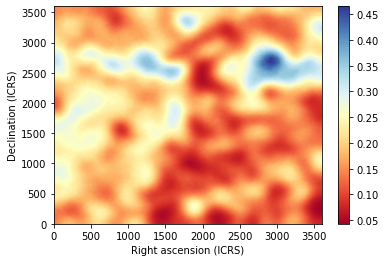

2022-08-13 13:25:51,888 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:25:51,889 : simulate_frequency : INFO : Simulating Galactic free-free map at 154.96 [MHz] ...
2022-08-13 13:25:52,013 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:25:53,213 : simulate_frequency : INFO : Done simulate map at 154.96 [MHz].
2022-08-13 13:25:53,375 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov2_0-27_154.96.fits']


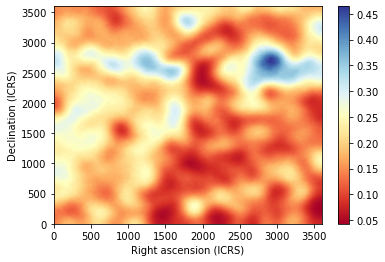

2022-08-13 13:25:54,622 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:25:54,623 : simulate_frequency : INFO : Simulating Galactic free-free map at 155.12 [MHz] ...
2022-08-13 13:25:54,746 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:25:55,945 : simulate_frequency : INFO : Done simulate map at 155.12 [MHz].
2022-08-13 13:25:56,027 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov2_0-27_155.12.fits']


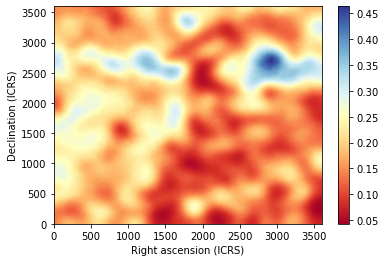

2022-08-13 13:25:57,275 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:25:57,276 : simulate_frequency : INFO : Simulating Galactic free-free map at 155.28 [MHz] ...
2022-08-13 13:25:57,400 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:25:58,598 : simulate_frequency : INFO : Done simulate map at 155.28 [MHz].
2022-08-13 13:25:58,680 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov2_0-27_155.28.fits']


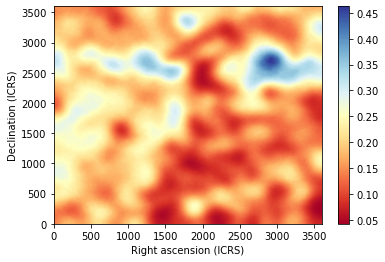

2022-08-13 13:25:59,928 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:25:59,929 : simulate_frequency : INFO : Simulating Galactic free-free map at 155.44 [MHz] ...
2022-08-13 13:26:00,052 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:26:01,250 : simulate_frequency : INFO : Done simulate map at 155.44 [MHz].
2022-08-13 13:26:01,343 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov2_0-27_155.44.fits']


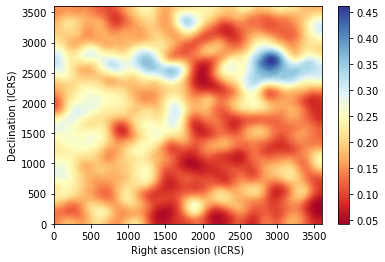

2022-08-13 13:26:02,591 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:26:02,592 : simulate_frequency : INFO : Simulating Galactic free-free map at 155.60 [MHz] ...
2022-08-13 13:26:02,715 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:26:03,914 : simulate_frequency : INFO : Done simulate map at 155.60 [MHz].
2022-08-13 13:26:04,052 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov2_0-27_155.60.fits']


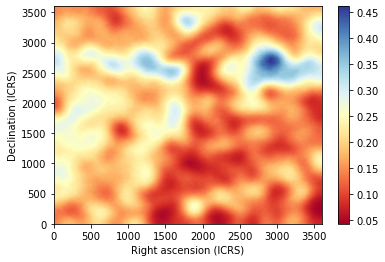

2022-08-13 13:26:05,301 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:26:05,302 : simulate_frequency : INFO : Simulating Galactic free-free map at 155.76 [MHz] ...
2022-08-13 13:26:05,426 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:26:06,626 : simulate_frequency : INFO : Done simulate map at 155.76 [MHz].
2022-08-13 13:26:06,709 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov2_0-27_155.76.fits']


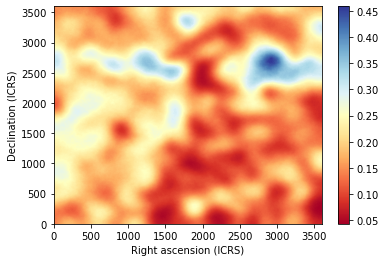

2022-08-13 13:26:07,956 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:26:07,957 : simulate_frequency : INFO : Simulating Galactic free-free map at 155.92 [MHz] ...
2022-08-13 13:26:08,080 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:26:09,280 : simulate_frequency : INFO : Done simulate map at 155.92 [MHz].
2022-08-13 13:26:09,361 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov2_0-27_155.92.fits']


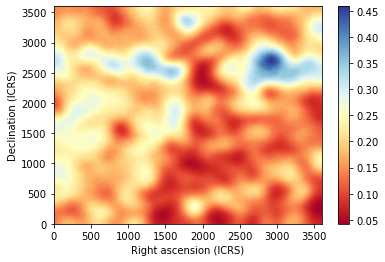

2022-08-13 13:26:10,609 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:26:10,610 : simulate_frequency : INFO : Simulating Galactic free-free map at 156.08 [MHz] ...
2022-08-13 13:26:10,732 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:26:11,932 : simulate_frequency : INFO : Done simulate map at 156.08 [MHz].
2022-08-13 13:26:12,014 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov2_0-27_156.08.fits']


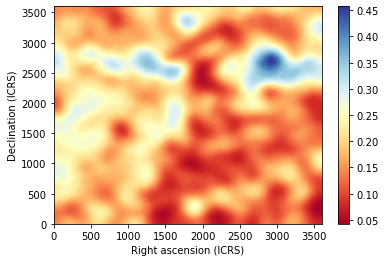

2022-08-13 13:26:13,263 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:26:13,264 : simulate_frequency : INFO : Simulating Galactic free-free map at 156.24 [MHz] ...
2022-08-13 13:26:13,388 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:26:14,588 : simulate_frequency : INFO : Done simulate map at 156.24 [MHz].
2022-08-13 13:26:14,670 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov2_0-27_156.24.fits']


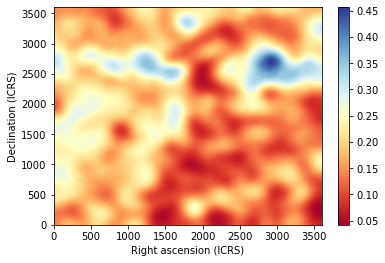

2022-08-13 13:26:15,918 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:26:15,919 : simulate_frequency : INFO : Simulating Galactic free-free map at 156.40 [MHz] ...
2022-08-13 13:26:16,043 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:26:17,243 : simulate_frequency : INFO : Done simulate map at 156.40 [MHz].
2022-08-13 13:26:17,324 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov2_0-27_156.40.fits']


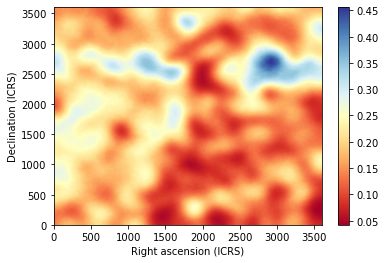

2022-08-13 13:26:18,699 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:26:18,701 : simulate_frequency : INFO : Simulating Galactic free-free map at 156.56 [MHz] ...
2022-08-13 13:26:18,824 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:26:20,024 : simulate_frequency : INFO : Done simulate map at 156.56 [MHz].
2022-08-13 13:26:20,106 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov2_0-27_156.56.fits']


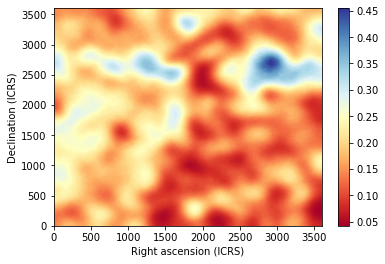

2022-08-13 13:26:21,353 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:26:21,354 : simulate_frequency : INFO : Simulating Galactic free-free map at 156.72 [MHz] ...
2022-08-13 13:26:21,477 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:26:22,675 : simulate_frequency : INFO : Done simulate map at 156.72 [MHz].
2022-08-13 13:26:22,756 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov2_0-27_156.72.fits']


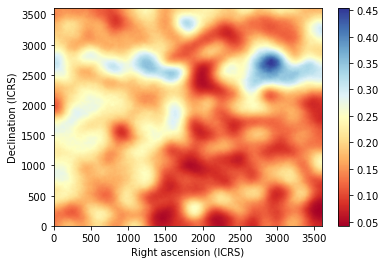

2022-08-13 13:26:24,005 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:26:24,006 : simulate_frequency : INFO : Simulating Galactic free-free map at 156.88 [MHz] ...
2022-08-13 13:26:24,130 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:26:25,329 : simulate_frequency : INFO : Done simulate map at 156.88 [MHz].
2022-08-13 13:26:25,410 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov2_0-27_156.88.fits']


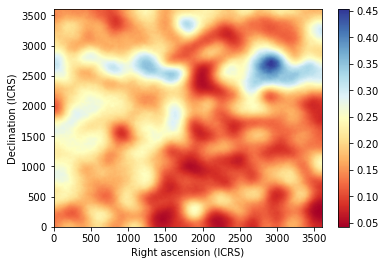

2022-08-13 13:26:26,660 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:26:26,661 : simulate_frequency : INFO : Simulating Galactic free-free map at 157.04 [MHz] ...
2022-08-13 13:26:26,785 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:26:27,983 : simulate_frequency : INFO : Done simulate map at 157.04 [MHz].
2022-08-13 13:26:28,103 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov2_0-27_157.04.fits']


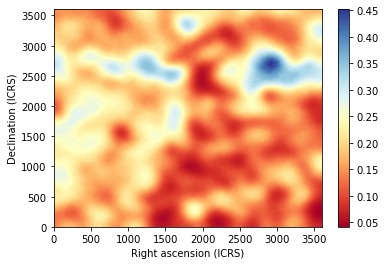

2022-08-13 13:26:29,351 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:26:29,352 : simulate_frequency : INFO : Simulating Galactic free-free map at 157.20 [MHz] ...
2022-08-13 13:26:29,475 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:26:30,674 : simulate_frequency : INFO : Done simulate map at 157.20 [MHz].
2022-08-13 13:26:30,755 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov2_0-27_157.20.fits']


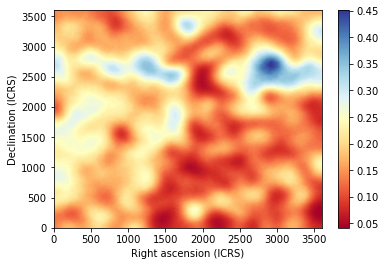

2022-08-13 13:26:32,003 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:26:32,004 : simulate_frequency : INFO : Simulating Galactic free-free map at 157.36 [MHz] ...
2022-08-13 13:26:32,127 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:26:33,325 : simulate_frequency : INFO : Done simulate map at 157.36 [MHz].
2022-08-13 13:26:33,406 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov2_0-27_157.36.fits']


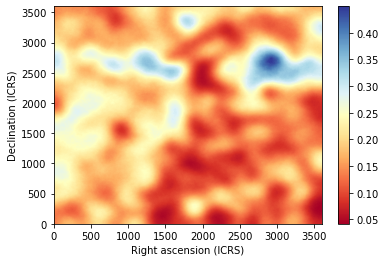

2022-08-13 13:26:34,651 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:26:34,652 : simulate_frequency : INFO : Simulating Galactic free-free map at 157.52 [MHz] ...
2022-08-13 13:26:34,776 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:26:35,979 : simulate_frequency : INFO : Done simulate map at 157.52 [MHz].
2022-08-13 13:26:36,061 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov2_0-27_157.52.fits']


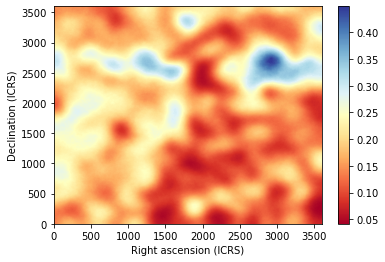

2022-08-13 13:26:37,306 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:26:37,307 : simulate_frequency : INFO : Simulating Galactic free-free map at 157.68 [MHz] ...
2022-08-13 13:26:37,431 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:26:38,632 : simulate_frequency : INFO : Done simulate map at 157.68 [MHz].
2022-08-13 13:26:38,714 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov2_0-27_157.68.fits']


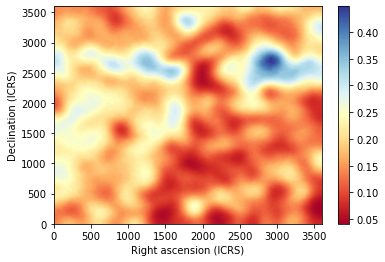

2022-08-13 13:26:39,961 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:26:39,962 : simulate_frequency : INFO : Simulating Galactic free-free map at 157.84 [MHz] ...
2022-08-13 13:26:40,086 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:26:41,287 : simulate_frequency : INFO : Done simulate map at 157.84 [MHz].
2022-08-13 13:26:41,369 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov2_0-27_157.84.fits']


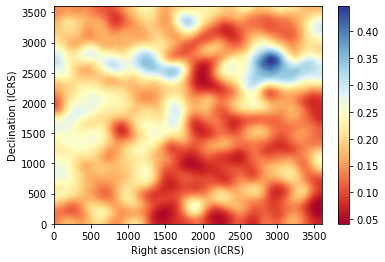

2022-08-13 13:26:42,619 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:26:42,620 : simulate_frequency : INFO : Simulating Galactic free-free map at 158.00 [MHz] ...
2022-08-13 13:26:42,744 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:26:43,943 : simulate_frequency : INFO : Done simulate map at 158.00 [MHz].
2022-08-13 13:26:44,172 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov2_0-27_158.00.fits']


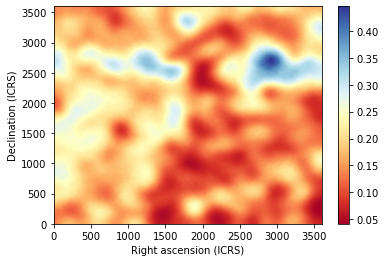

2022-08-13 13:26:45,418 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:26:45,419 : simulate_frequency : INFO : Simulating Galactic free-free map at 158.16 [MHz] ...
2022-08-13 13:26:45,542 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:26:46,741 : simulate_frequency : INFO : Done simulate map at 158.16 [MHz].
2022-08-13 13:26:46,905 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov2_0-27_158.16.fits']


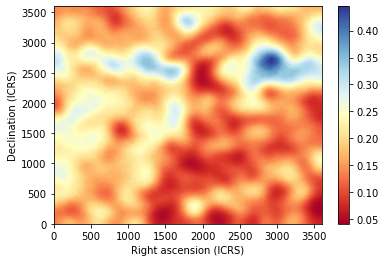

2022-08-13 13:26:48,276 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:26:48,277 : simulate_frequency : INFO : Simulating Galactic free-free map at 158.32 [MHz] ...
2022-08-13 13:26:48,400 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:26:49,598 : simulate_frequency : INFO : Done simulate map at 158.32 [MHz].
2022-08-13 13:26:49,738 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov2_0-27_158.32.fits']


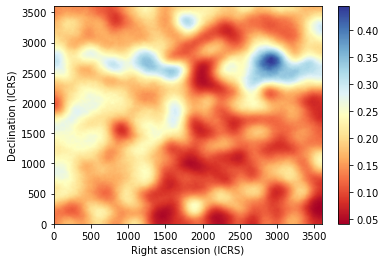

2022-08-13 13:26:50,982 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:26:50,983 : simulate_frequency : INFO : Simulating Galactic free-free map at 158.48 [MHz] ...
2022-08-13 13:26:51,107 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:26:52,306 : simulate_frequency : INFO : Done simulate map at 158.48 [MHz].
2022-08-13 13:26:52,456 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov2_0-27_158.48.fits']


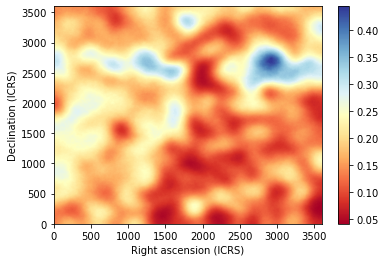

2022-08-13 13:26:53,702 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:26:53,703 : simulate_frequency : INFO : Simulating Galactic free-free map at 158.64 [MHz] ...
2022-08-13 13:26:53,827 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:26:55,026 : simulate_frequency : INFO : Done simulate map at 158.64 [MHz].
2022-08-13 13:26:55,280 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov2_0-27_158.64.fits']


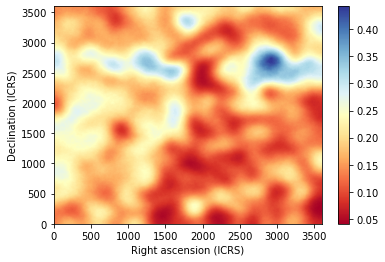

2022-08-13 13:26:56,526 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:26:56,527 : simulate_frequency : INFO : Simulating Galactic free-free map at 158.80 [MHz] ...
2022-08-13 13:26:56,650 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:26:57,849 : simulate_frequency : INFO : Done simulate map at 158.80 [MHz].
2022-08-13 13:26:57,998 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov2_0-27_158.80.fits']


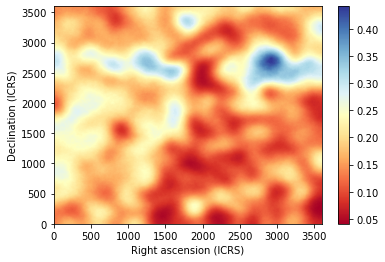

2022-08-13 13:26:59,242 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:26:59,243 : simulate_frequency : INFO : Simulating Galactic free-free map at 158.96 [MHz] ...
2022-08-13 13:26:59,366 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:27:00,564 : simulate_frequency : INFO : Done simulate map at 158.96 [MHz].
2022-08-13 13:27:00,701 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov2_0-27_158.96.fits']


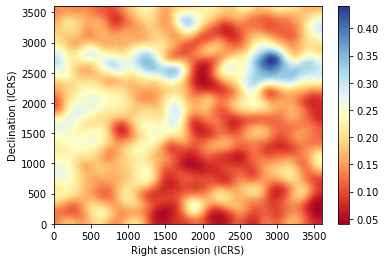

2022-08-13 13:27:01,947 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:27:01,948 : simulate_frequency : INFO : Simulating Galactic free-free map at 159.12 [MHz] ...
2022-08-13 13:27:02,071 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:27:03,270 : simulate_frequency : INFO : Done simulate map at 159.12 [MHz].
2022-08-13 13:27:03,391 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov2_0-27_159.12.fits']


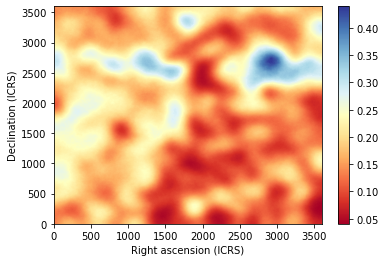

2022-08-13 13:27:04,638 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:27:04,639 : simulate_frequency : INFO : Simulating Galactic free-free map at 159.28 [MHz] ...
2022-08-13 13:27:04,763 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:27:05,965 : simulate_frequency : INFO : Done simulate map at 159.28 [MHz].
2022-08-13 13:27:06,047 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov2_0-27_159.28.fits']


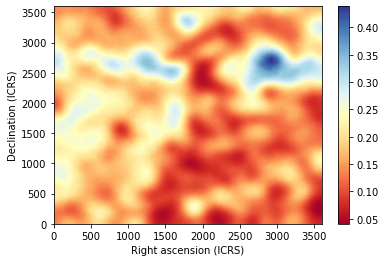

2022-08-13 13:27:07,293 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:27:07,294 : simulate_frequency : INFO : Simulating Galactic free-free map at 159.44 [MHz] ...
2022-08-13 13:27:07,419 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:27:08,620 : simulate_frequency : INFO : Done simulate map at 159.44 [MHz].
2022-08-13 13:27:08,702 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov2_0-27_159.44.fits']


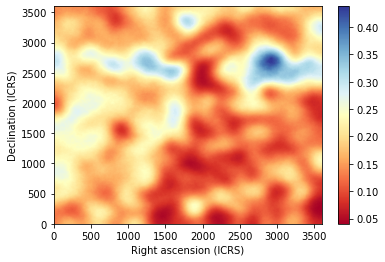

2022-08-13 13:27:09,947 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:27:09,947 : simulate_frequency : INFO : Simulating Galactic free-free map at 159.60 [MHz] ...
2022-08-13 13:27:10,071 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:27:11,272 : simulate_frequency : INFO : Done simulate map at 159.60 [MHz].
2022-08-13 13:27:11,475 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov2_0-27_159.60.fits']


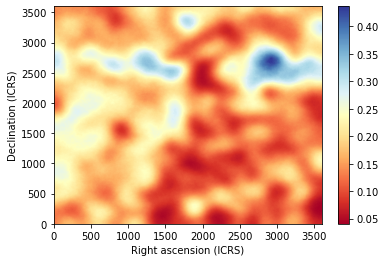

2022-08-13 13:27:12,720 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:27:12,721 : simulate_frequency : INFO : Simulating Galactic free-free map at 159.76 [MHz] ...
2022-08-13 13:27:12,844 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:27:14,045 : simulate_frequency : INFO : Done simulate map at 159.76 [MHz].
2022-08-13 13:27:14,127 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov2_0-27_159.76.fits']


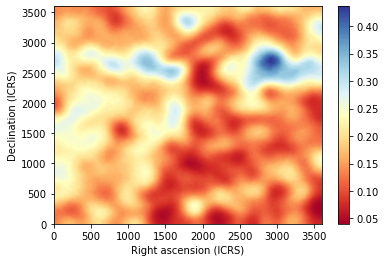

2022-08-13 13:27:15,374 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:27:15,375 : simulate_frequency : INFO : Simulating Galactic free-free map at 159.92 [MHz] ...
2022-08-13 13:27:15,499 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:27:16,699 : simulate_frequency : INFO : Done simulate map at 159.92 [MHz].
2022-08-13 13:27:16,935 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov2_0-27_159.92.fits']


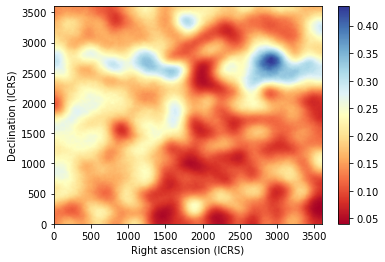

2022-08-13 13:27:18,307 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:27:18,308 : simulate_frequency : INFO : Simulating Galactic free-free map at 160.08 [MHz] ...
2022-08-13 13:27:18,431 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:27:19,630 : simulate_frequency : INFO : Done simulate map at 160.08 [MHz].
2022-08-13 13:27:19,814 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov2_0-27_160.08.fits']


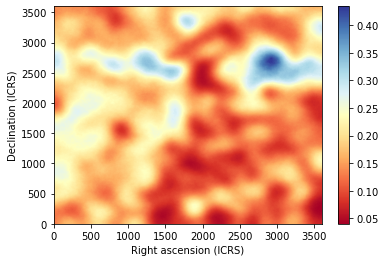

2022-08-13 13:27:21,057 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:27:21,058 : simulate_frequency : INFO : Simulating Galactic free-free map at 160.24 [MHz] ...
2022-08-13 13:27:21,182 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:27:22,381 : simulate_frequency : INFO : Done simulate map at 160.24 [MHz].
2022-08-13 13:27:22,463 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov2_0-27_160.24.fits']


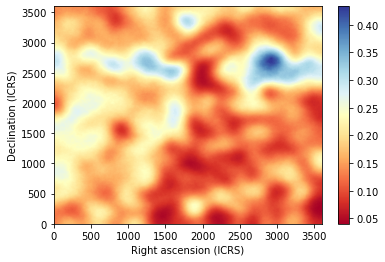

2022-08-13 13:27:23,709 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:27:23,710 : simulate_frequency : INFO : Simulating Galactic free-free map at 160.40 [MHz] ...
2022-08-13 13:27:23,835 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:27:25,033 : simulate_frequency : INFO : Done simulate map at 160.40 [MHz].
2022-08-13 13:27:25,115 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov2_0-27_160.40.fits']


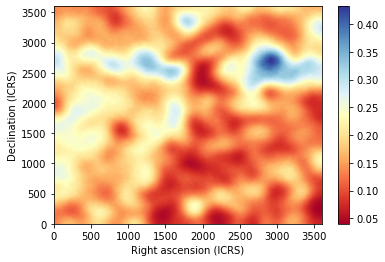

2022-08-13 13:27:26,361 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:27:26,362 : simulate_frequency : INFO : Simulating Galactic free-free map at 160.56 [MHz] ...
2022-08-13 13:27:26,486 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:27:27,685 : simulate_frequency : INFO : Done simulate map at 160.56 [MHz].
2022-08-13 13:27:27,766 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov2_0-27_160.56.fits']


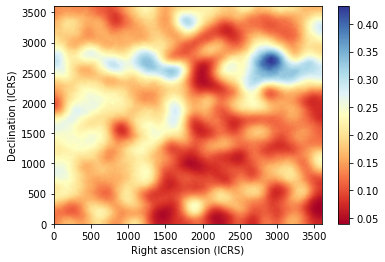

2022-08-13 13:27:29,012 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:27:29,013 : simulate_frequency : INFO : Simulating Galactic free-free map at 160.72 [MHz] ...
2022-08-13 13:27:29,136 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:27:30,334 : simulate_frequency : INFO : Done simulate map at 160.72 [MHz].
2022-08-13 13:27:30,416 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov2_0-27_160.72.fits']


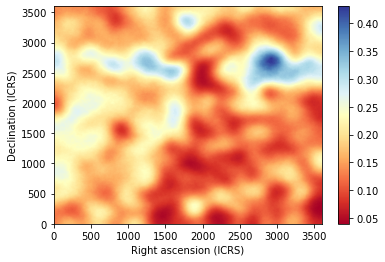

2022-08-13 13:27:31,660 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:27:31,661 : simulate_frequency : INFO : Simulating Galactic free-free map at 160.88 [MHz] ...
2022-08-13 13:27:31,785 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:27:32,984 : simulate_frequency : INFO : Done simulate map at 160.88 [MHz].
2022-08-13 13:27:33,121 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov2_0-27_160.88.fits']


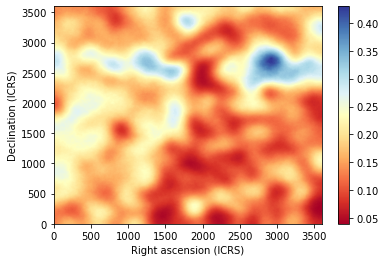

2022-08-13 13:27:34,368 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:27:34,369 : simulate_frequency : INFO : Simulating Galactic free-free map at 161.04 [MHz] ...
2022-08-13 13:27:34,492 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:27:35,690 : simulate_frequency : INFO : Done simulate map at 161.04 [MHz].
2022-08-13 13:27:35,779 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov2_0-27_161.04.fits']


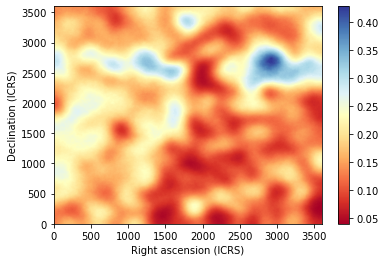

2022-08-13 13:27:37,024 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:27:37,025 : simulate_frequency : INFO : Simulating Galactic free-free map at 161.20 [MHz] ...
2022-08-13 13:27:37,148 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:27:38,346 : simulate_frequency : INFO : Done simulate map at 161.20 [MHz].
2022-08-13 13:27:38,427 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov2_0-27_161.20.fits']


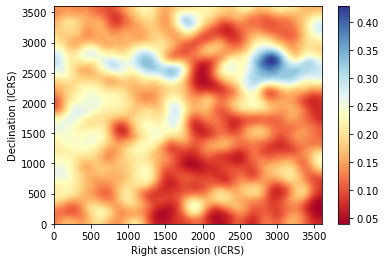

2022-08-13 13:27:39,669 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:27:39,670 : simulate_frequency : INFO : Simulating Galactic free-free map at 161.36 [MHz] ...
2022-08-13 13:27:39,793 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:27:40,992 : simulate_frequency : INFO : Done simulate map at 161.36 [MHz].
2022-08-13 13:27:41,073 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov2_0-27_161.36.fits']


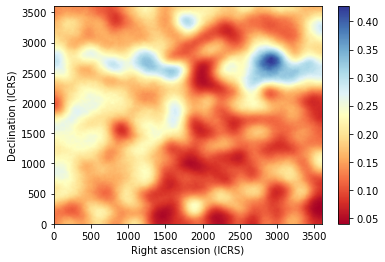

2022-08-13 13:27:42,316 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:27:42,317 : simulate_frequency : INFO : Simulating Galactic free-free map at 161.52 [MHz] ...
2022-08-13 13:27:42,440 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:27:43,639 : simulate_frequency : INFO : Done simulate map at 161.52 [MHz].
2022-08-13 13:27:43,760 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov2_0-27_161.52.fits']


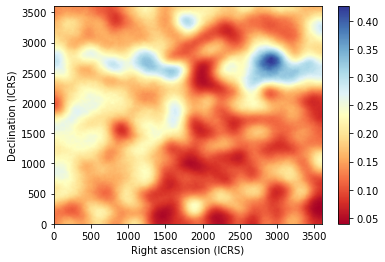

2022-08-13 13:27:45,007 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:27:45,007 : simulate_frequency : INFO : Simulating Galactic free-free map at 161.68 [MHz] ...
2022-08-13 13:27:45,130 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:27:46,331 : simulate_frequency : INFO : Done simulate map at 161.68 [MHz].
2022-08-13 13:27:46,413 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov2_0-27_161.68.fits']


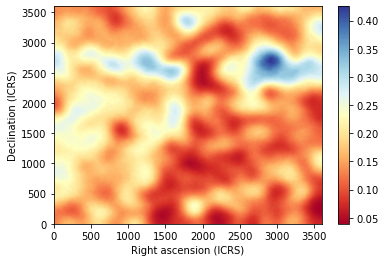

2022-08-13 13:27:47,788 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:27:47,789 : simulate_frequency : INFO : Simulating Galactic free-free map at 161.84 [MHz] ...
2022-08-13 13:27:47,912 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:27:49,111 : simulate_frequency : INFO : Done simulate map at 161.84 [MHz].
2022-08-13 13:27:49,207 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov2_0-27_161.84.fits']


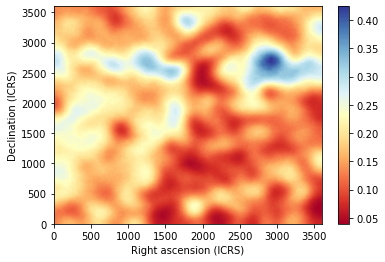

2022-08-13 13:27:50,450 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:27:50,451 : simulate_frequency : INFO : Simulating Galactic free-free map at 162.00 [MHz] ...
2022-08-13 13:27:50,573 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:27:51,772 : simulate_frequency : INFO : Done simulate map at 162.00 [MHz].
2022-08-13 13:27:51,989 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162/gfree_fov2_0-27_162.00.fits']


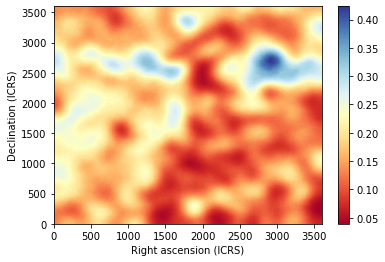

In [27]:
do_simulation(Sfov2.freqs['mid']['f'], Sfov2, fov2_outmid)

##### hig band

2022-08-13 13:27:53,241 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:27:53,243 : simulate_frequency : INFO : Simulating Galactic free-free map at 188.00 [MHz] ...
2022-08-13 13:27:53,369 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:27:54,568 : simulate_frequency : INFO : Done simulate map at 188.00 [MHz].
2022-08-13 13:27:54,650 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov2_0-27_188.00.fits']


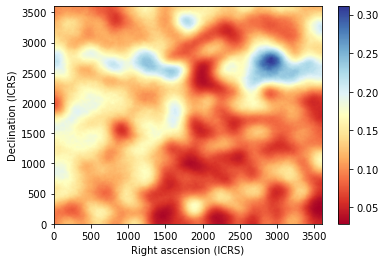

2022-08-13 13:27:55,888 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:27:55,889 : simulate_frequency : INFO : Simulating Galactic free-free map at 188.16 [MHz] ...
2022-08-13 13:27:56,013 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:27:57,212 : simulate_frequency : INFO : Done simulate map at 188.16 [MHz].
2022-08-13 13:27:57,335 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov2_0-27_188.16.fits']


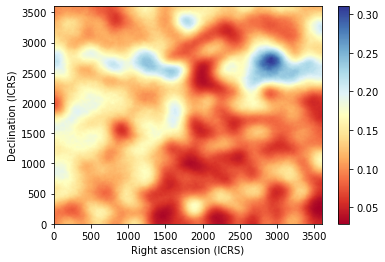

2022-08-13 13:27:58,572 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:27:58,573 : simulate_frequency : INFO : Simulating Galactic free-free map at 188.32 [MHz] ...
2022-08-13 13:27:58,697 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:27:59,896 : simulate_frequency : INFO : Done simulate map at 188.32 [MHz].
2022-08-13 13:27:59,988 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov2_0-27_188.32.fits']


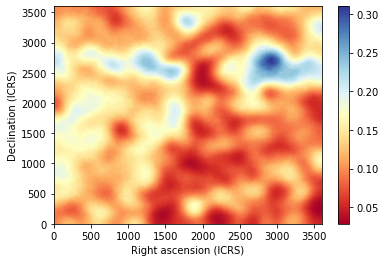

2022-08-13 13:28:01,221 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:28:01,221 : simulate_frequency : INFO : Simulating Galactic free-free map at 188.48 [MHz] ...
2022-08-13 13:28:01,345 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:28:02,544 : simulate_frequency : INFO : Done simulate map at 188.48 [MHz].
2022-08-13 13:28:02,626 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov2_0-27_188.48.fits']


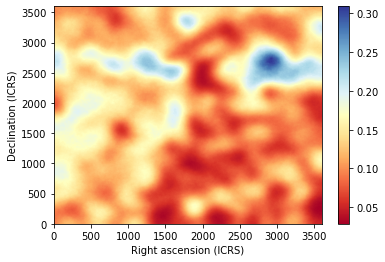

2022-08-13 13:28:03,860 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:28:03,861 : simulate_frequency : INFO : Simulating Galactic free-free map at 188.64 [MHz] ...
2022-08-13 13:28:03,985 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:28:05,184 : simulate_frequency : INFO : Done simulate map at 188.64 [MHz].
2022-08-13 13:28:05,266 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov2_0-27_188.64.fits']


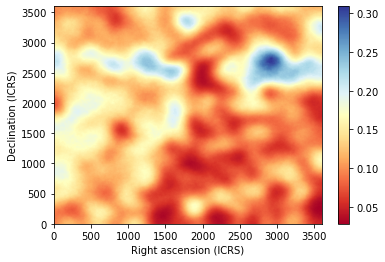

2022-08-13 13:28:06,499 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:28:06,500 : simulate_frequency : INFO : Simulating Galactic free-free map at 188.80 [MHz] ...
2022-08-13 13:28:06,622 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:28:07,822 : simulate_frequency : INFO : Done simulate map at 188.80 [MHz].
2022-08-13 13:28:07,904 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov2_0-27_188.80.fits']


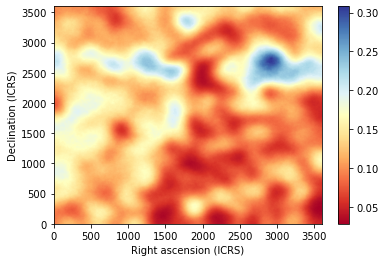

2022-08-13 13:28:09,138 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:28:09,139 : simulate_frequency : INFO : Simulating Galactic free-free map at 188.96 [MHz] ...
2022-08-13 13:28:09,263 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:28:10,462 : simulate_frequency : INFO : Done simulate map at 188.96 [MHz].
2022-08-13 13:28:10,543 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov2_0-27_188.96.fits']


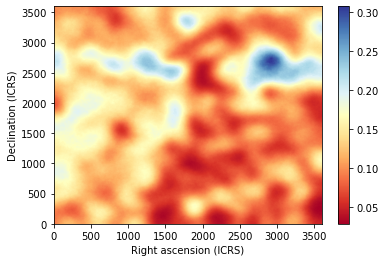

2022-08-13 13:28:11,778 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:28:11,779 : simulate_frequency : INFO : Simulating Galactic free-free map at 189.12 [MHz] ...
2022-08-13 13:28:11,902 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:28:13,101 : simulate_frequency : INFO : Done simulate map at 189.12 [MHz].
2022-08-13 13:28:13,183 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov2_0-27_189.12.fits']


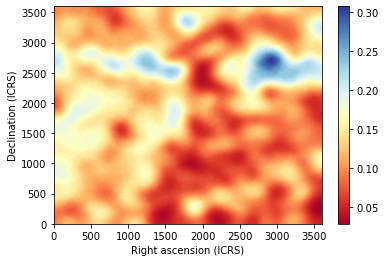

2022-08-13 13:28:14,421 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:28:14,422 : simulate_frequency : INFO : Simulating Galactic free-free map at 189.28 [MHz] ...
2022-08-13 13:28:14,545 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:28:15,746 : simulate_frequency : INFO : Done simulate map at 189.28 [MHz].
2022-08-13 13:28:15,838 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov2_0-27_189.28.fits']


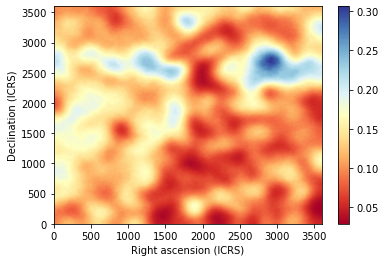

2022-08-13 13:28:17,201 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:28:17,202 : simulate_frequency : INFO : Simulating Galactic free-free map at 189.44 [MHz] ...
2022-08-13 13:28:17,325 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:28:18,526 : simulate_frequency : INFO : Done simulate map at 189.44 [MHz].
2022-08-13 13:28:18,617 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov2_0-27_189.44.fits']


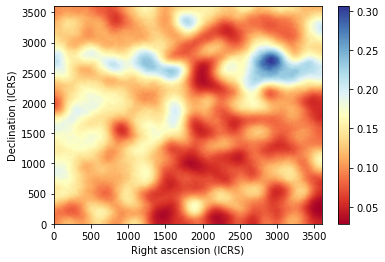

2022-08-13 13:28:19,849 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:28:19,850 : simulate_frequency : INFO : Simulating Galactic free-free map at 189.60 [MHz] ...
2022-08-13 13:28:19,973 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:28:21,171 : simulate_frequency : INFO : Done simulate map at 189.60 [MHz].
2022-08-13 13:28:21,253 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov2_0-27_189.60.fits']


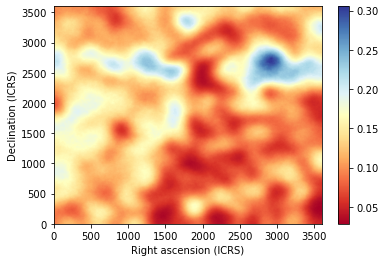

2022-08-13 13:28:22,487 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:28:22,488 : simulate_frequency : INFO : Simulating Galactic free-free map at 189.76 [MHz] ...
2022-08-13 13:28:22,612 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:28:23,812 : simulate_frequency : INFO : Done simulate map at 189.76 [MHz].
2022-08-13 13:28:24,013 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov2_0-27_189.76.fits']


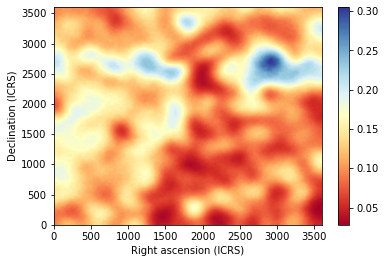

2022-08-13 13:28:25,251 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:28:25,252 : simulate_frequency : INFO : Simulating Galactic free-free map at 189.92 [MHz] ...
2022-08-13 13:28:25,375 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:28:26,574 : simulate_frequency : INFO : Done simulate map at 189.92 [MHz].
2022-08-13 13:28:26,669 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov2_0-27_189.92.fits']


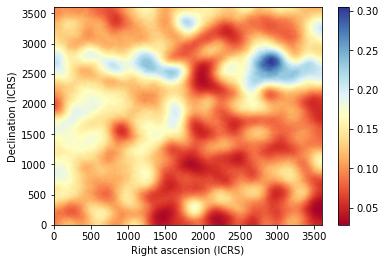

2022-08-13 13:28:27,909 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:28:27,910 : simulate_frequency : INFO : Simulating Galactic free-free map at 190.08 [MHz] ...
2022-08-13 13:28:28,033 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:28:29,234 : simulate_frequency : INFO : Done simulate map at 190.08 [MHz].
2022-08-13 13:28:29,316 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov2_0-27_190.08.fits']


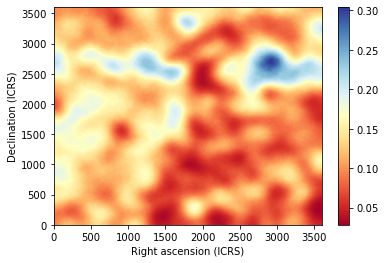

2022-08-13 13:28:30,551 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:28:30,552 : simulate_frequency : INFO : Simulating Galactic free-free map at 190.24 [MHz] ...
2022-08-13 13:28:30,675 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:28:31,874 : simulate_frequency : INFO : Done simulate map at 190.24 [MHz].
2022-08-13 13:28:32,119 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov2_0-27_190.24.fits']


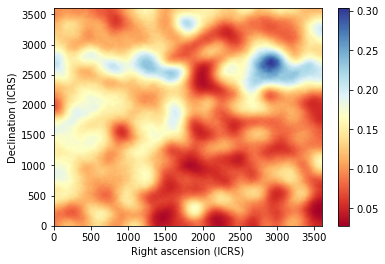

2022-08-13 13:28:33,355 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:28:33,356 : simulate_frequency : INFO : Simulating Galactic free-free map at 190.40 [MHz] ...
2022-08-13 13:28:33,479 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:28:34,678 : simulate_frequency : INFO : Done simulate map at 190.40 [MHz].
2022-08-13 13:28:34,760 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov2_0-27_190.40.fits']


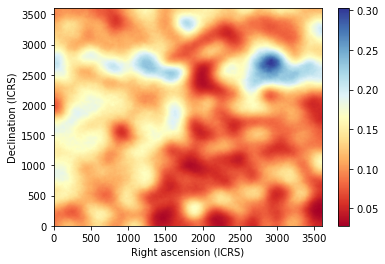

2022-08-13 13:28:35,995 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:28:35,996 : simulate_frequency : INFO : Simulating Galactic free-free map at 190.56 [MHz] ...
2022-08-13 13:28:36,119 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:28:37,319 : simulate_frequency : INFO : Done simulate map at 190.56 [MHz].
2022-08-13 13:28:37,401 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov2_0-27_190.56.fits']


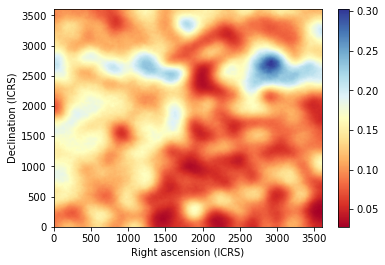

2022-08-13 13:28:38,637 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:28:38,637 : simulate_frequency : INFO : Simulating Galactic free-free map at 190.72 [MHz] ...
2022-08-13 13:28:38,761 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:28:39,961 : simulate_frequency : INFO : Done simulate map at 190.72 [MHz].
2022-08-13 13:28:40,042 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov2_0-27_190.72.fits']


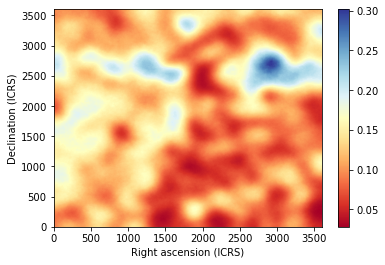

2022-08-13 13:28:41,326 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:28:41,327 : simulate_frequency : INFO : Simulating Galactic free-free map at 190.88 [MHz] ...
2022-08-13 13:28:41,450 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:28:42,649 : simulate_frequency : INFO : Done simulate map at 190.88 [MHz].
2022-08-13 13:28:42,730 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov2_0-27_190.88.fits']


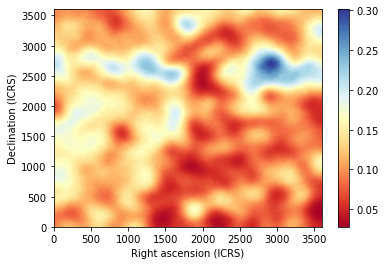

2022-08-13 13:28:43,971 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:28:43,972 : simulate_frequency : INFO : Simulating Galactic free-free map at 191.04 [MHz] ...
2022-08-13 13:28:44,095 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:28:45,293 : simulate_frequency : INFO : Done simulate map at 191.04 [MHz].
2022-08-13 13:28:45,373 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov2_0-27_191.04.fits']


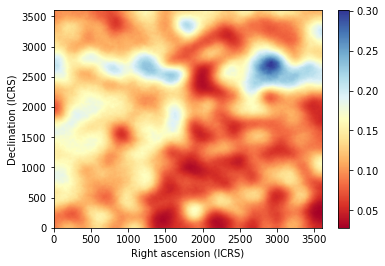

2022-08-13 13:28:46,733 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:28:46,734 : simulate_frequency : INFO : Simulating Galactic free-free map at 191.20 [MHz] ...
2022-08-13 13:28:46,857 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:28:48,057 : simulate_frequency : INFO : Done simulate map at 191.20 [MHz].
2022-08-13 13:28:48,295 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov2_0-27_191.20.fits']


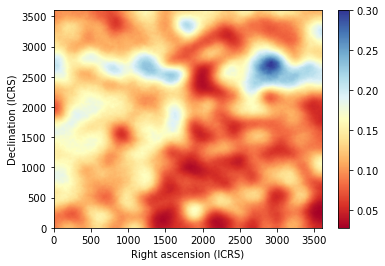

2022-08-13 13:28:49,528 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:28:49,529 : simulate_frequency : INFO : Simulating Galactic free-free map at 191.36 [MHz] ...
2022-08-13 13:28:49,651 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:28:50,851 : simulate_frequency : INFO : Done simulate map at 191.36 [MHz].
2022-08-13 13:28:51,066 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov2_0-27_191.36.fits']


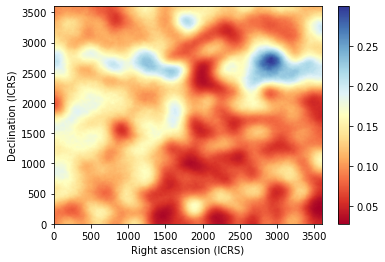

2022-08-13 13:28:52,296 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:28:52,297 : simulate_frequency : INFO : Simulating Galactic free-free map at 191.52 [MHz] ...
2022-08-13 13:28:52,422 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:28:53,623 : simulate_frequency : INFO : Done simulate map at 191.52 [MHz].
2022-08-13 13:28:53,722 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov2_0-27_191.52.fits']


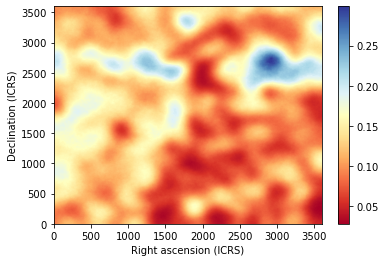

2022-08-13 13:28:54,955 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:28:54,956 : simulate_frequency : INFO : Simulating Galactic free-free map at 191.68 [MHz] ...
2022-08-13 13:28:55,080 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:28:56,280 : simulate_frequency : INFO : Done simulate map at 191.68 [MHz].
2022-08-13 13:28:56,361 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov2_0-27_191.68.fits']


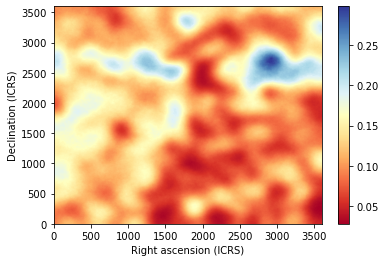

2022-08-13 13:28:57,592 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:28:57,593 : simulate_frequency : INFO : Simulating Galactic free-free map at 191.84 [MHz] ...
2022-08-13 13:28:57,716 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:28:58,917 : simulate_frequency : INFO : Done simulate map at 191.84 [MHz].
2022-08-13 13:28:59,017 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov2_0-27_191.84.fits']


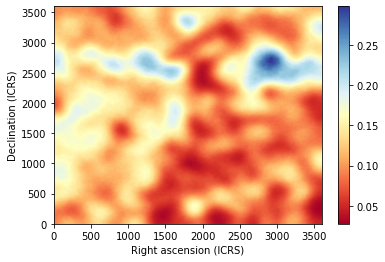

2022-08-13 13:29:00,250 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:29:00,251 : simulate_frequency : INFO : Simulating Galactic free-free map at 192.00 [MHz] ...
2022-08-13 13:29:00,375 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:29:01,574 : simulate_frequency : INFO : Done simulate map at 192.00 [MHz].
2022-08-13 13:29:01,674 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov2_0-27_192.00.fits']


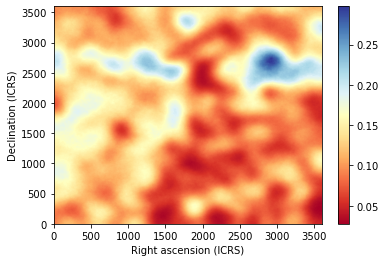

2022-08-13 13:29:02,908 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:29:02,909 : simulate_frequency : INFO : Simulating Galactic free-free map at 192.16 [MHz] ...
2022-08-13 13:29:03,033 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:29:04,234 : simulate_frequency : INFO : Done simulate map at 192.16 [MHz].
2022-08-13 13:29:04,473 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov2_0-27_192.16.fits']


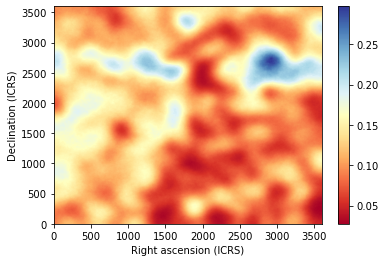

2022-08-13 13:29:05,702 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:29:05,703 : simulate_frequency : INFO : Simulating Galactic free-free map at 192.32 [MHz] ...
2022-08-13 13:29:05,825 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:29:07,024 : simulate_frequency : INFO : Done simulate map at 192.32 [MHz].
2022-08-13 13:29:07,163 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov2_0-27_192.32.fits']


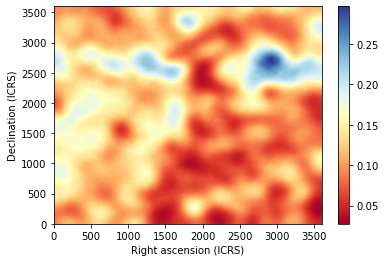

2022-08-13 13:29:08,393 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:29:08,394 : simulate_frequency : INFO : Simulating Galactic free-free map at 192.48 [MHz] ...
2022-08-13 13:29:08,518 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:29:09,716 : simulate_frequency : INFO : Done simulate map at 192.48 [MHz].
2022-08-13 13:29:09,921 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov2_0-27_192.48.fits']


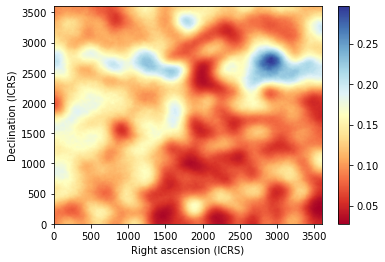

2022-08-13 13:29:11,151 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:29:11,152 : simulate_frequency : INFO : Simulating Galactic free-free map at 192.64 [MHz] ...
2022-08-13 13:29:11,275 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:29:12,474 : simulate_frequency : INFO : Done simulate map at 192.64 [MHz].
2022-08-13 13:29:12,620 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov2_0-27_192.64.fits']


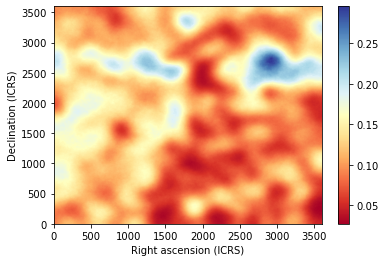

2022-08-13 13:29:13,856 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:29:13,857 : simulate_frequency : INFO : Simulating Galactic free-free map at 192.80 [MHz] ...
2022-08-13 13:29:13,984 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:29:15,185 : simulate_frequency : INFO : Done simulate map at 192.80 [MHz].
2022-08-13 13:29:15,266 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov2_0-27_192.80.fits']


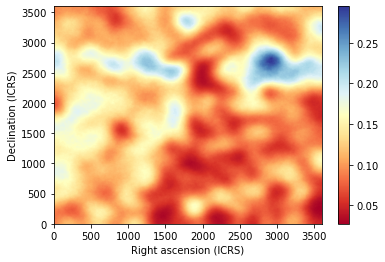

2022-08-13 13:29:16,623 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:29:16,624 : simulate_frequency : INFO : Simulating Galactic free-free map at 192.96 [MHz] ...
2022-08-13 13:29:16,747 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:29:17,950 : simulate_frequency : INFO : Done simulate map at 192.96 [MHz].
2022-08-13 13:29:18,084 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov2_0-27_192.96.fits']


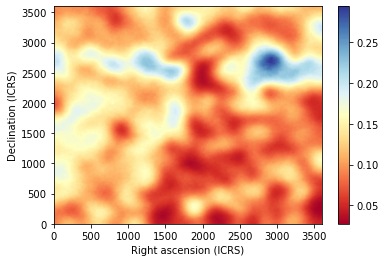

2022-08-13 13:29:19,315 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:29:19,316 : simulate_frequency : INFO : Simulating Galactic free-free map at 193.12 [MHz] ...
2022-08-13 13:29:19,439 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:29:20,640 : simulate_frequency : INFO : Done simulate map at 193.12 [MHz].
2022-08-13 13:29:20,722 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov2_0-27_193.12.fits']


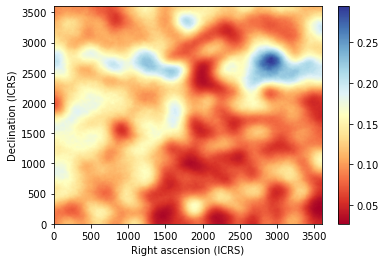

2022-08-13 13:29:21,948 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:29:21,949 : simulate_frequency : INFO : Simulating Galactic free-free map at 193.28 [MHz] ...
2022-08-13 13:29:22,073 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:29:23,274 : simulate_frequency : INFO : Done simulate map at 193.28 [MHz].
2022-08-13 13:29:23,366 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov2_0-27_193.28.fits']


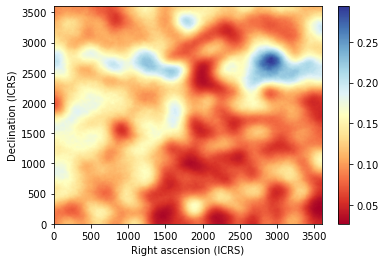

2022-08-13 13:29:24,598 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:29:24,599 : simulate_frequency : INFO : Simulating Galactic free-free map at 193.44 [MHz] ...
2022-08-13 13:29:24,722 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:29:25,922 : simulate_frequency : INFO : Done simulate map at 193.44 [MHz].
2022-08-13 13:29:26,004 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov2_0-27_193.44.fits']


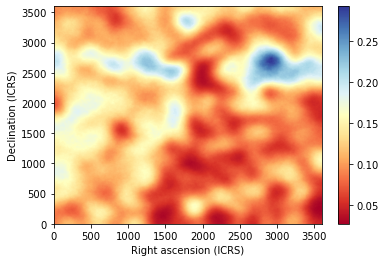

2022-08-13 13:29:27,234 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:29:27,235 : simulate_frequency : INFO : Simulating Galactic free-free map at 193.60 [MHz] ...
2022-08-13 13:29:27,359 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:29:28,559 : simulate_frequency : INFO : Done simulate map at 193.60 [MHz].
2022-08-13 13:29:28,690 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov2_0-27_193.60.fits']


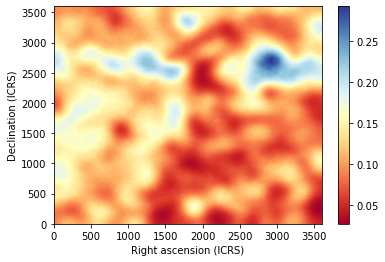

2022-08-13 13:29:29,920 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:29:29,921 : simulate_frequency : INFO : Simulating Galactic free-free map at 193.76 [MHz] ...
2022-08-13 13:29:30,044 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:29:31,242 : simulate_frequency : INFO : Done simulate map at 193.76 [MHz].
2022-08-13 13:29:31,324 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov2_0-27_193.76.fits']


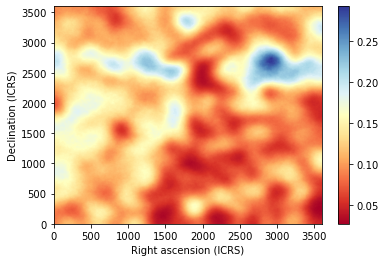

2022-08-13 13:29:32,555 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:29:32,556 : simulate_frequency : INFO : Simulating Galactic free-free map at 193.92 [MHz] ...
2022-08-13 13:29:32,679 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:29:33,878 : simulate_frequency : INFO : Done simulate map at 193.92 [MHz].
2022-08-13 13:29:33,999 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov2_0-27_193.92.fits']


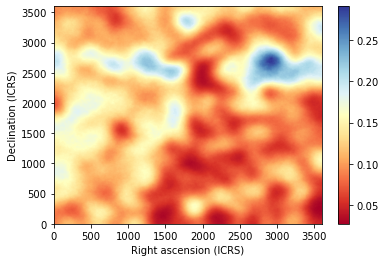

2022-08-13 13:29:35,228 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:29:35,229 : simulate_frequency : INFO : Simulating Galactic free-free map at 194.08 [MHz] ...
2022-08-13 13:29:35,352 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:29:36,551 : simulate_frequency : INFO : Done simulate map at 194.08 [MHz].
2022-08-13 13:29:36,633 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov2_0-27_194.08.fits']


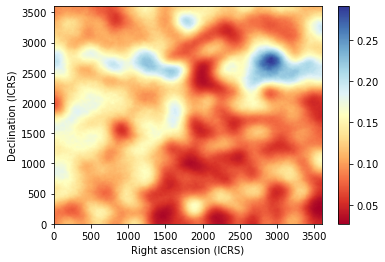

2022-08-13 13:29:37,864 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:29:37,865 : simulate_frequency : INFO : Simulating Galactic free-free map at 194.24 [MHz] ...
2022-08-13 13:29:37,989 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:29:39,189 : simulate_frequency : INFO : Done simulate map at 194.24 [MHz].
2022-08-13 13:29:39,400 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov2_0-27_194.24.fits']


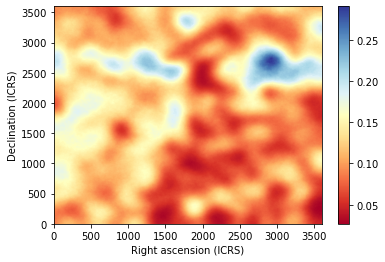

2022-08-13 13:29:40,632 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:29:40,633 : simulate_frequency : INFO : Simulating Galactic free-free map at 194.40 [MHz] ...
2022-08-13 13:29:40,756 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:29:41,957 : simulate_frequency : INFO : Done simulate map at 194.40 [MHz].
2022-08-13 13:29:42,174 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov2_0-27_194.40.fits']


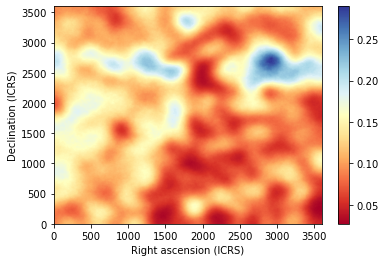

2022-08-13 13:29:43,407 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:29:43,408 : simulate_frequency : INFO : Simulating Galactic free-free map at 194.56 [MHz] ...
2022-08-13 13:29:43,532 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:29:44,735 : simulate_frequency : INFO : Done simulate map at 194.56 [MHz].
2022-08-13 13:29:44,827 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov2_0-27_194.56.fits']


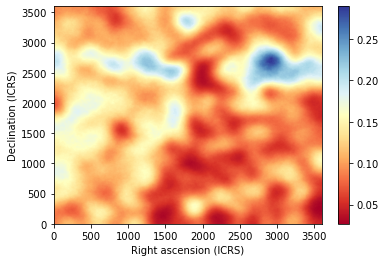

2022-08-13 13:29:46,182 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:29:46,183 : simulate_frequency : INFO : Simulating Galactic free-free map at 194.72 [MHz] ...
2022-08-13 13:29:46,306 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:29:47,505 : simulate_frequency : INFO : Done simulate map at 194.72 [MHz].
2022-08-13 13:29:47,625 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov2_0-27_194.72.fits']


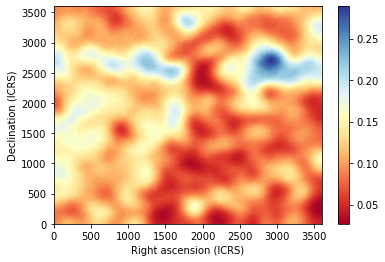

2022-08-13 13:29:48,852 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:29:48,853 : simulate_frequency : INFO : Simulating Galactic free-free map at 194.88 [MHz] ...
2022-08-13 13:29:48,976 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:29:50,176 : simulate_frequency : INFO : Done simulate map at 194.88 [MHz].
2022-08-13 13:29:50,258 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov2_0-27_194.88.fits']


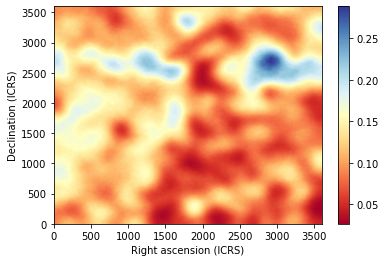

2022-08-13 13:29:51,486 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:29:51,486 : simulate_frequency : INFO : Simulating Galactic free-free map at 195.04 [MHz] ...
2022-08-13 13:29:51,611 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:29:52,809 : simulate_frequency : INFO : Done simulate map at 195.04 [MHz].
2022-08-13 13:29:52,905 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov2_0-27_195.04.fits']


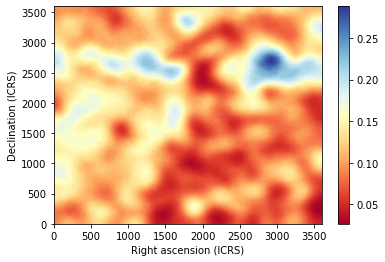

2022-08-13 13:29:54,137 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:29:54,138 : simulate_frequency : INFO : Simulating Galactic free-free map at 195.20 [MHz] ...
2022-08-13 13:29:54,262 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:29:55,462 : simulate_frequency : INFO : Done simulate map at 195.20 [MHz].
2022-08-13 13:29:55,552 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov2_0-27_195.20.fits']


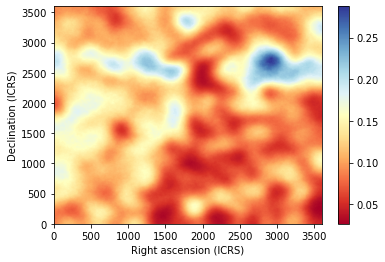

2022-08-13 13:29:56,783 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:29:56,784 : simulate_frequency : INFO : Simulating Galactic free-free map at 195.36 [MHz] ...
2022-08-13 13:29:56,907 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:29:58,107 : simulate_frequency : INFO : Done simulate map at 195.36 [MHz].
2022-08-13 13:29:58,229 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov2_0-27_195.36.fits']


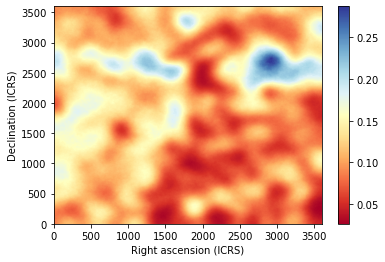

2022-08-13 13:29:59,462 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:29:59,463 : simulate_frequency : INFO : Simulating Galactic free-free map at 195.52 [MHz] ...
2022-08-13 13:29:59,587 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:30:00,786 : simulate_frequency : INFO : Done simulate map at 195.52 [MHz].
2022-08-13 13:30:00,868 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov2_0-27_195.52.fits']


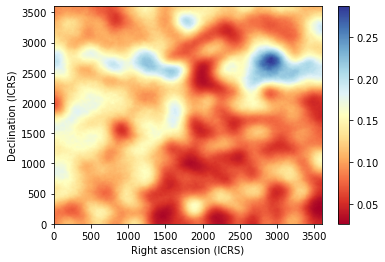

2022-08-13 13:30:02,100 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:30:02,101 : simulate_frequency : INFO : Simulating Galactic free-free map at 195.68 [MHz] ...
2022-08-13 13:30:02,225 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:30:03,424 : simulate_frequency : INFO : Done simulate map at 195.68 [MHz].
2022-08-13 13:30:03,545 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov2_0-27_195.68.fits']


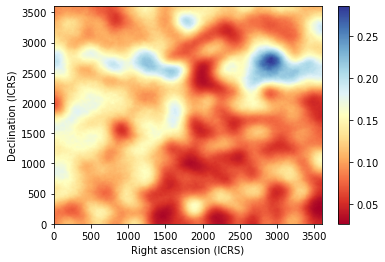

2022-08-13 13:30:04,777 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:30:04,778 : simulate_frequency : INFO : Simulating Galactic free-free map at 195.84 [MHz] ...
2022-08-13 13:30:04,901 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:30:06,101 : simulate_frequency : INFO : Done simulate map at 195.84 [MHz].
2022-08-13 13:30:06,220 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov2_0-27_195.84.fits']


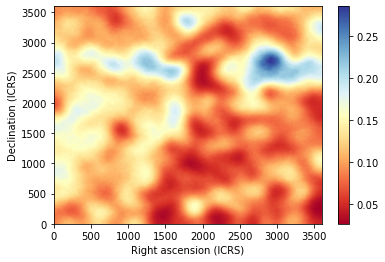

2022-08-13 13:30:07,451 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:30:07,452 : simulate_frequency : INFO : Simulating Galactic free-free map at 196.00 [MHz] ...
2022-08-13 13:30:07,575 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:30:08,774 : simulate_frequency : INFO : Done simulate map at 196.00 [MHz].
2022-08-13 13:30:08,856 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196/gfree_fov2_0-27_196.00.fits']


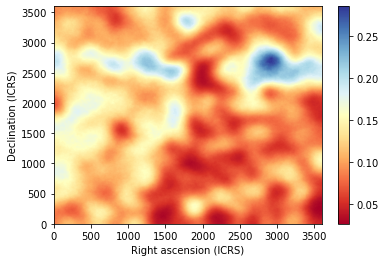

In [28]:
do_simulation(Sfov2.freqs['hig']['f'], Sfov2, fov2_outhig)